In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_vae
from autoencoder import network_vae
from autoencoder import utils

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/MNIST/"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/MNIST/mnist.mm']
(4,) [60000    28    28     1]
60000


dict_keys(['mnist.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

60000


Encoder True
Tensor("Placeholder:0", shape=(?, 28, 28, 1), dtype=float32) (?, 28, 28, 1)
isize:  7 28
dh0 (128, 28, 28, 1)
60000 468 128
Epoch:  0 Iteration:  0 Loss:  543.9121 543.8772 0.03498029


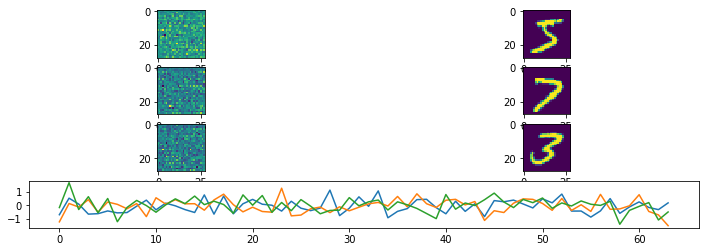

Epoch:  0 Iteration:  200 Loss:  227.9921 215.71756 12.274542


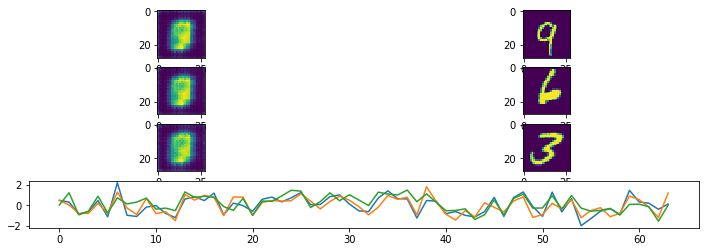

Epoch:  0 Iteration:  400 Loss:  198.45102 189.09805 9.352976


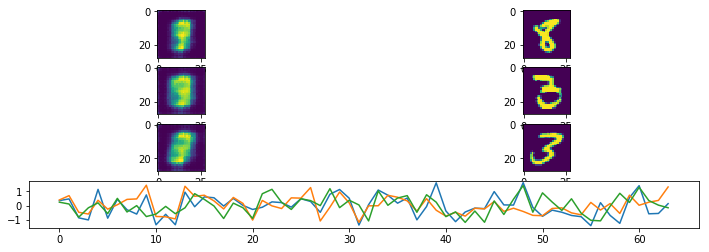

Epoch:  1 Iteration:  0 Loss:  185.3994 175.57806 9.82132


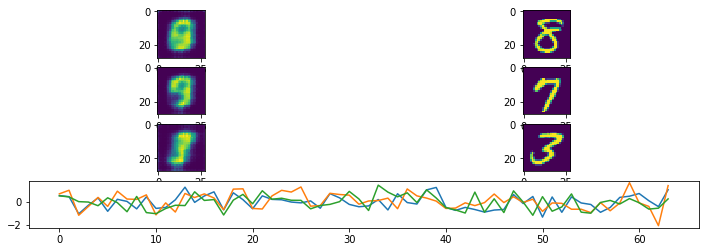

Epoch:  1 Iteration:  200 Loss:  160.47694 148.56949 11.907452


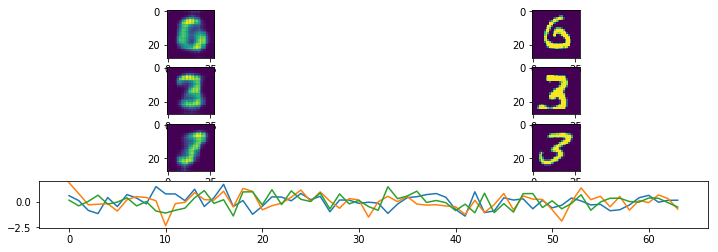

Epoch:  1 Iteration:  400 Loss:  141.65573 128.01657 13.639177


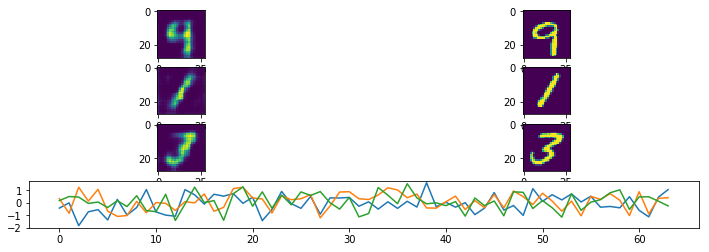

Epoch:  2 Iteration:  0 Loss:  139.21829 125.92975 13.288544


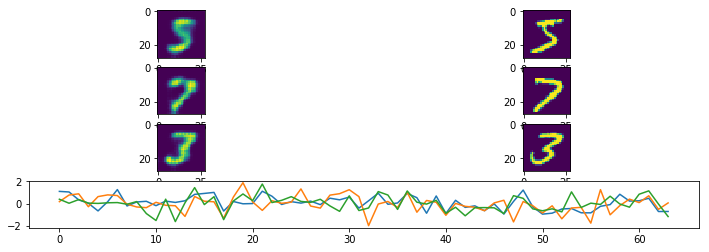

Epoch:  2 Iteration:  200 Loss:  129.79578 115.77777 14.018005


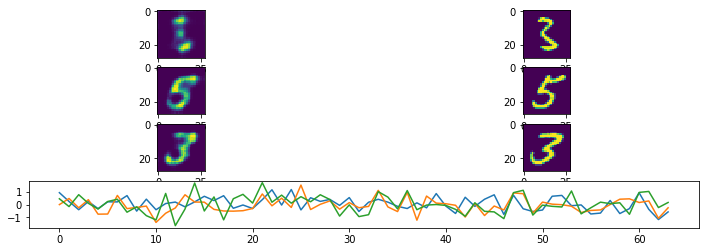

Epoch:  2 Iteration:  400 Loss:  119.918724 104.71709 15.201635


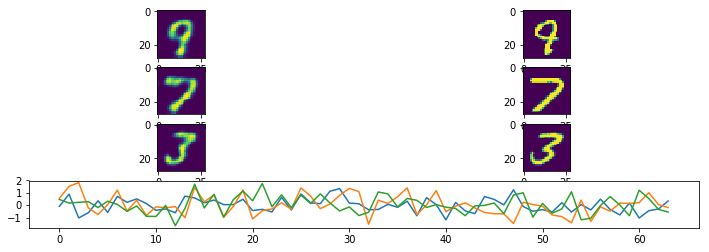

Epoch:  3 Iteration:  0 Loss:  121.50088 106.73716 14.763715


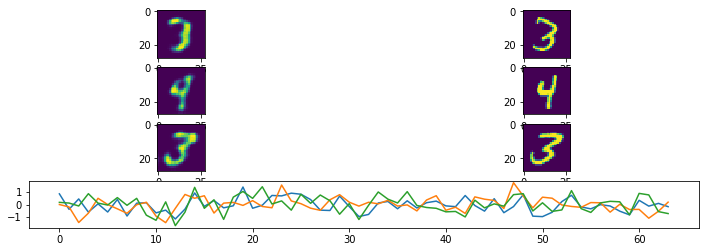

Epoch:  3 Iteration:  200 Loss:  116.71592 101.36916 15.346762


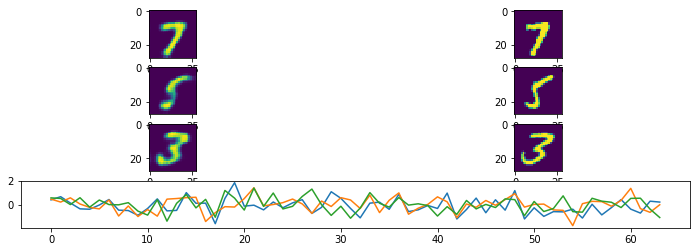

Epoch:  3 Iteration:  400 Loss:  110.63925 94.27335 16.365904


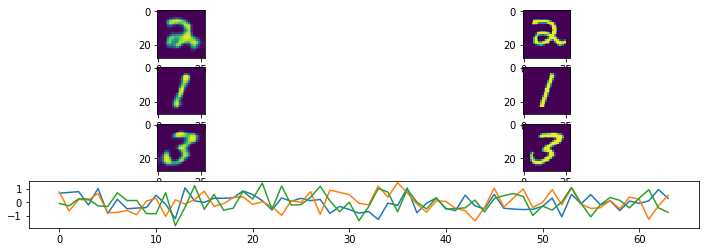

Epoch:  4 Iteration:  0 Loss:  113.24672 97.44588 15.800846


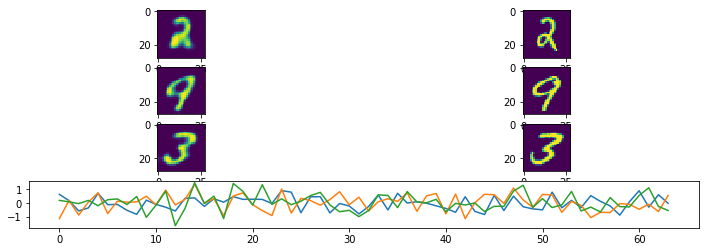

Epoch:  4 Iteration:  200 Loss:  108.15169 91.719536 16.432148


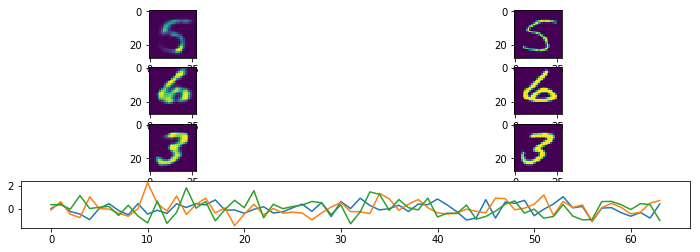

Epoch:  4 Iteration:  400 Loss:  104.3938 87.29029 17.10351


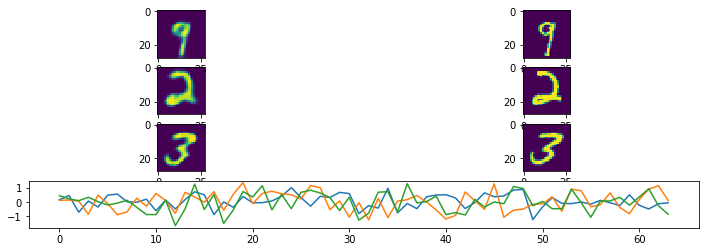

Epoch:  5 Iteration:  0 Loss:  105.77275 89.31075 16.461998


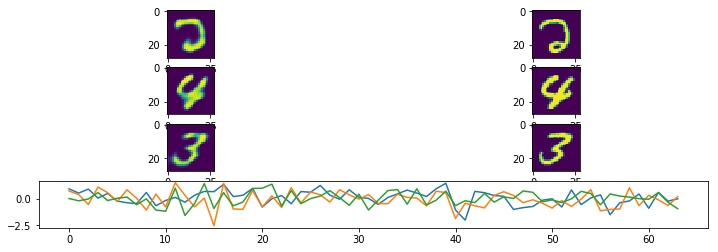

Epoch:  5 Iteration:  200 Loss:  102.12917 85.07483 17.054342


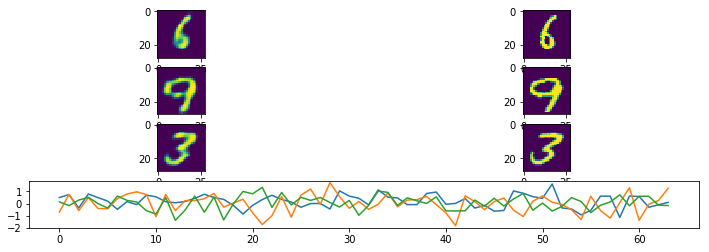

Epoch:  5 Iteration:  400 Loss:  99.68609 82.30229 17.383795


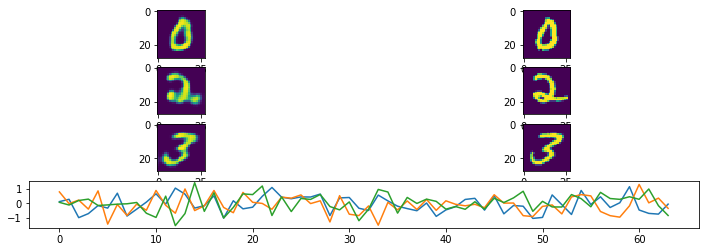

Epoch:  6 Iteration:  0 Loss:  102.45044 85.6138 16.836637


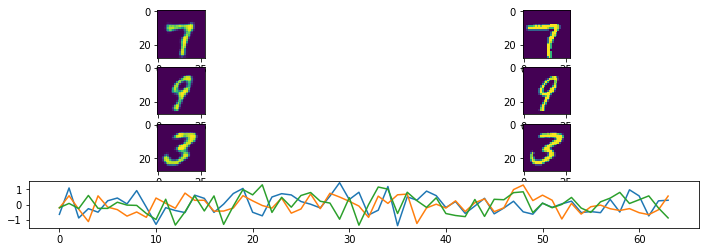

Epoch:  6 Iteration:  200 Loss:  99.34227 82.14858 17.193676


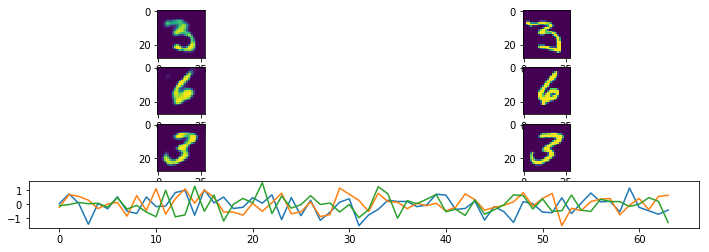

Epoch:  6 Iteration:  400 Loss:  97.11569 79.85897 17.256725


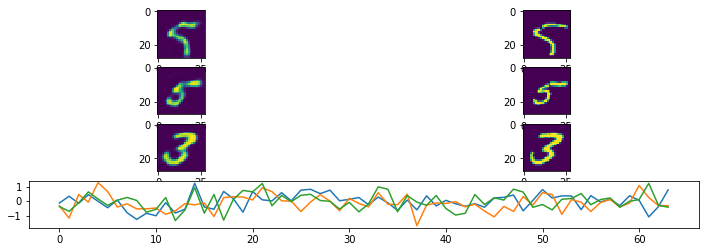

Epoch:  7 Iteration:  0 Loss:  98.83014 81.68139 17.14875


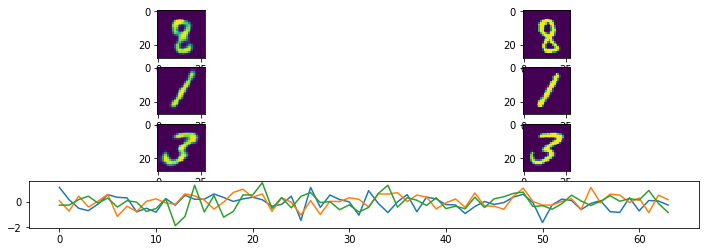

Epoch:  7 Iteration:  200 Loss:  97.027435 79.66461 17.36282


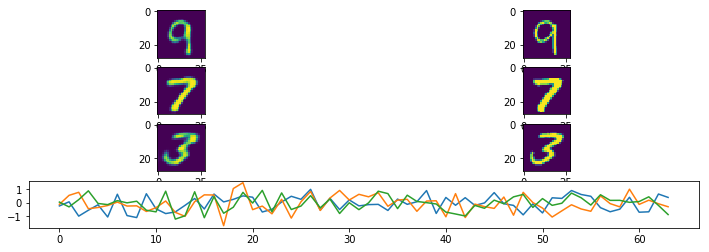

Epoch:  7 Iteration:  400 Loss:  94.32457 77.00929 17.315271


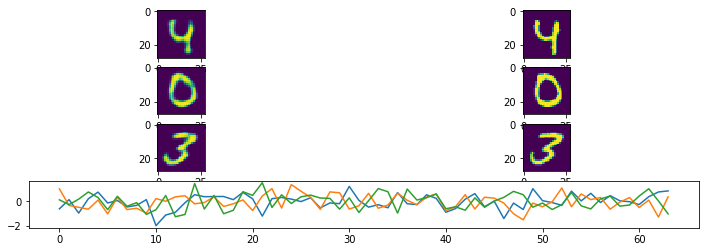

Epoch:  8 Iteration:  0 Loss:  96.7559 79.668495 17.087395


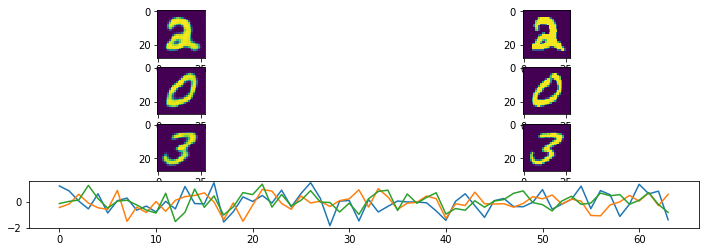

Epoch:  8 Iteration:  200 Loss:  94.90054 77.45642 17.444118


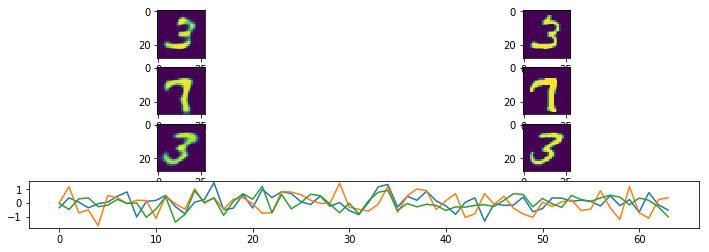

Epoch:  8 Iteration:  400 Loss:  93.05158 75.625374 17.426205


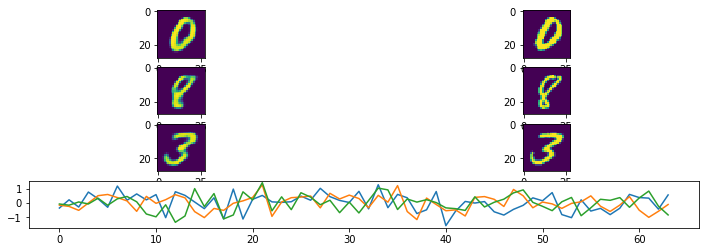

Epoch:  9 Iteration:  0 Loss:  94.98323 77.585754 17.397484


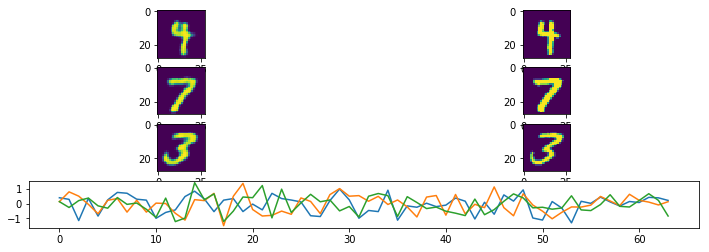

Epoch:  9 Iteration:  200 Loss:  93.20889 75.97938 17.229523


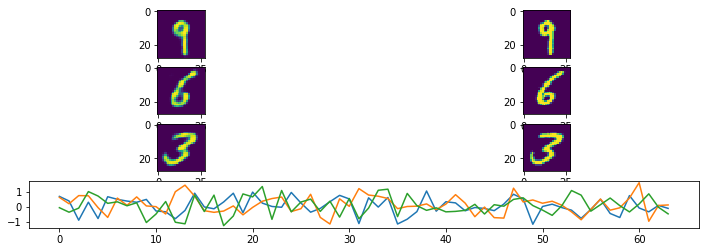

Epoch:  9 Iteration:  400 Loss:  91.851974 74.52209 17.329887


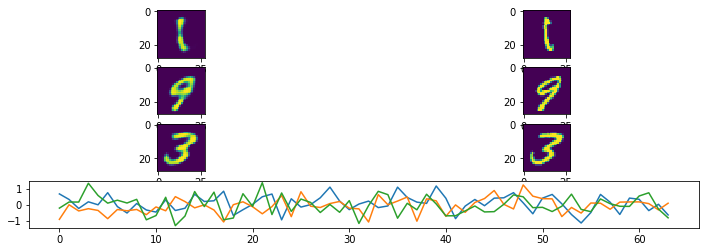

Epoch:  10 Iteration:  0 Loss:  92.92073 75.89526 17.025478


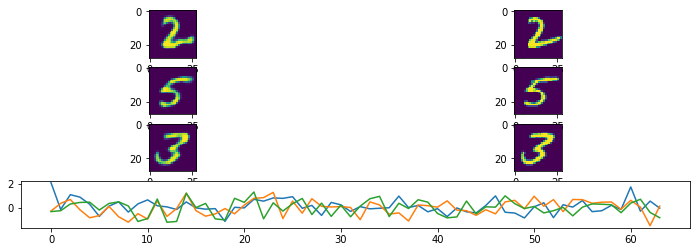

Epoch:  10 Iteration:  200 Loss:  92.080185 74.797714 17.28247


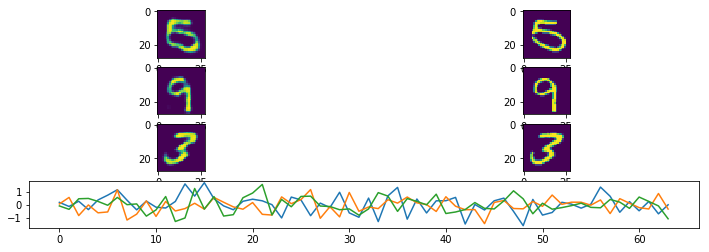

Epoch:  10 Iteration:  400 Loss:  90.4465 73.26577 17.180735


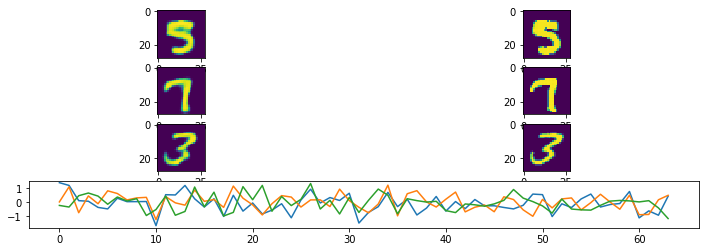

Epoch:  11 Iteration:  0 Loss:  91.98036 74.79147 17.188889


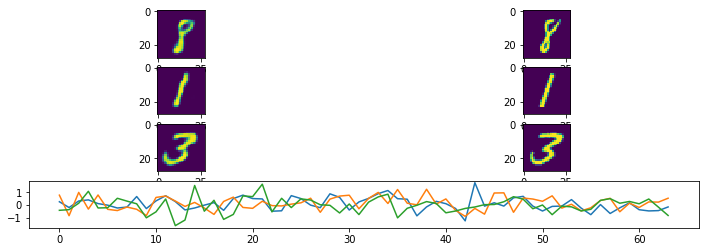

Epoch:  11 Iteration:  200 Loss:  90.85855 73.8405 17.018055


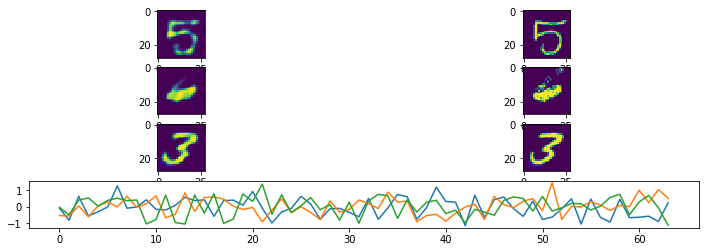

Epoch:  11 Iteration:  400 Loss:  88.5305 71.42508 17.10542


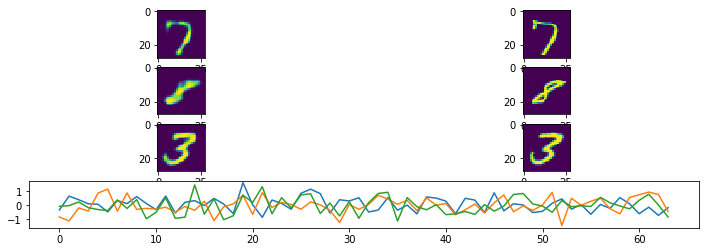

Epoch:  12 Iteration:  0 Loss:  91.2948 74.27829 17.016512


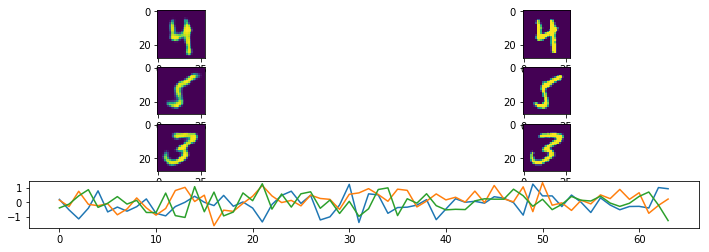

Epoch:  12 Iteration:  200 Loss:  89.88794 72.69229 17.195642


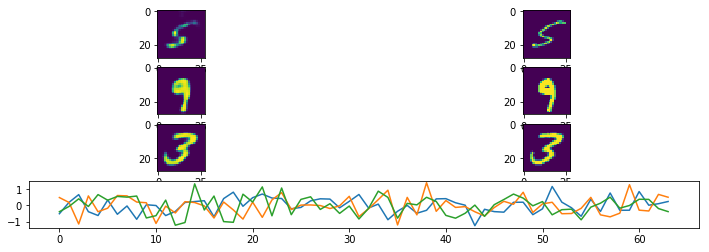

Epoch:  12 Iteration:  400 Loss:  87.88888 70.973694 16.915184


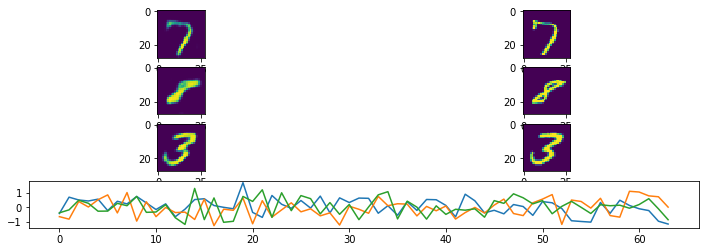

Epoch:  13 Iteration:  0 Loss:  90.35799 73.463104 16.894876


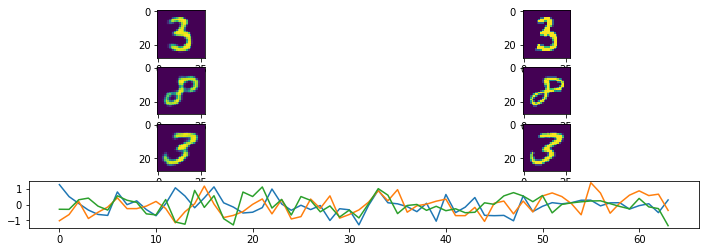

Epoch:  13 Iteration:  200 Loss:  89.79237 72.89445 16.897928


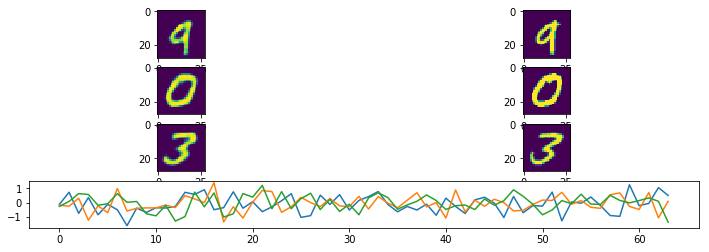

Epoch:  13 Iteration:  400 Loss:  87.72011 70.887405 16.832699


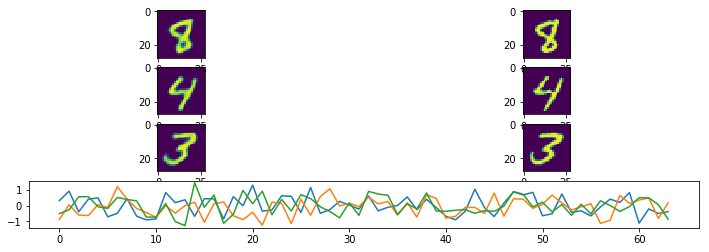

Epoch:  14 Iteration:  0 Loss:  89.629036 72.79689 16.832153


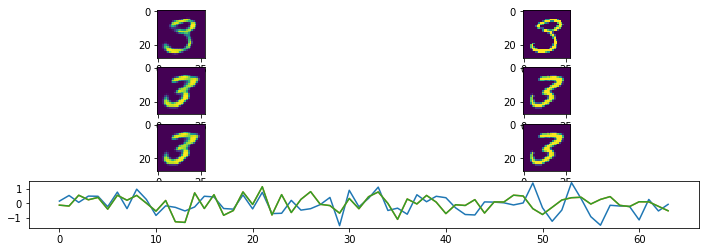

Epoch:  14 Iteration:  200 Loss:  88.175 71.32062 16.854387


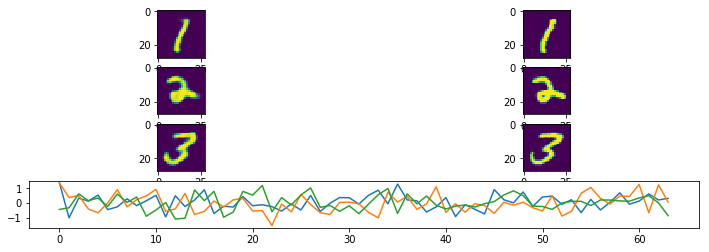

Epoch:  14 Iteration:  400 Loss:  86.80188 69.88075 16.921124


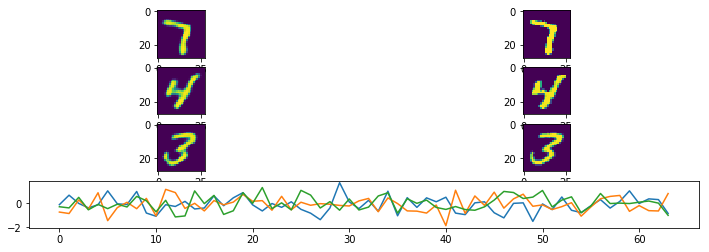

Epoch:  15 Iteration:  0 Loss:  89.01448 71.997986 17.01649


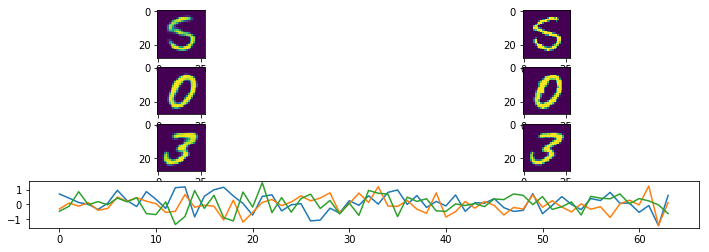

Epoch:  15 Iteration:  200 Loss:  87.483894 70.575836 16.908058


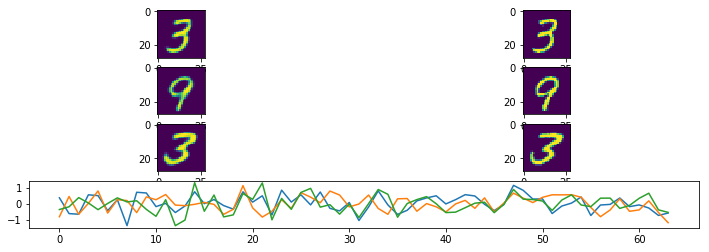

Epoch:  15 Iteration:  400 Loss:  86.33974 69.46925 16.870476


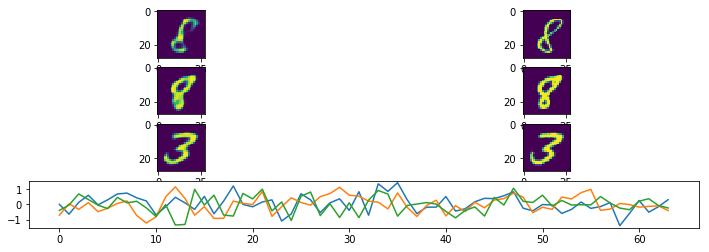

Epoch:  16 Iteration:  0 Loss:  88.30188 71.191986 17.10991


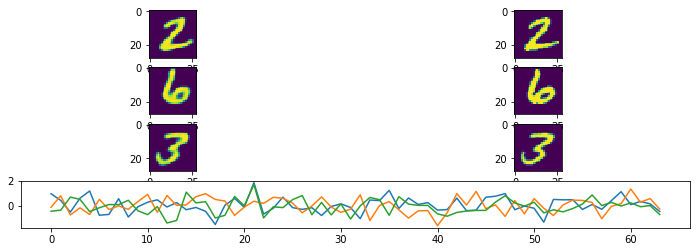

Epoch:  16 Iteration:  200 Loss:  86.97672 70.228546 16.748177


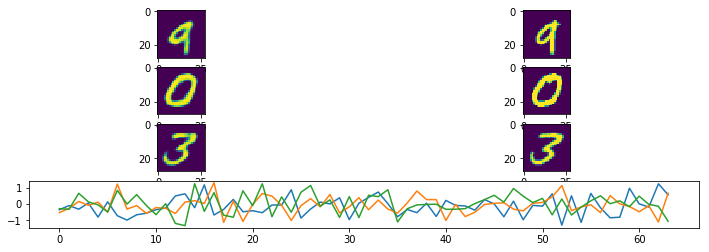

Epoch:  16 Iteration:  400 Loss:  86.12835 69.48907 16.639278


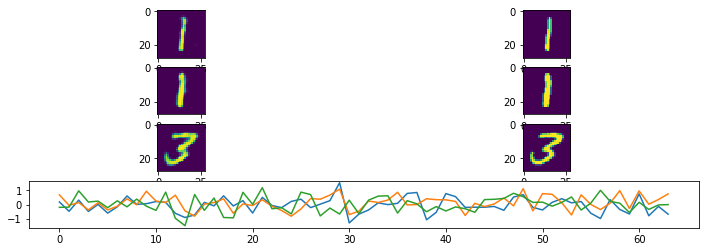

Epoch:  17 Iteration:  0 Loss:  87.81189 70.765724 17.04617


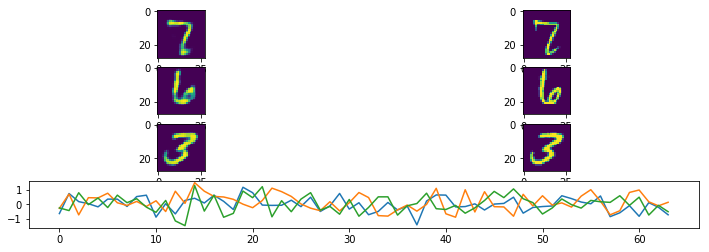

Epoch:  17 Iteration:  200 Loss:  86.68813 70.013336 16.6748


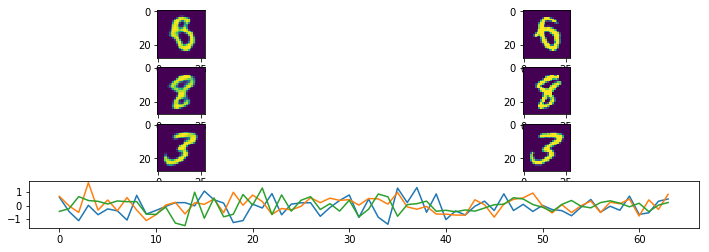

Epoch:  17 Iteration:  400 Loss:  85.45505 68.791084 16.663967


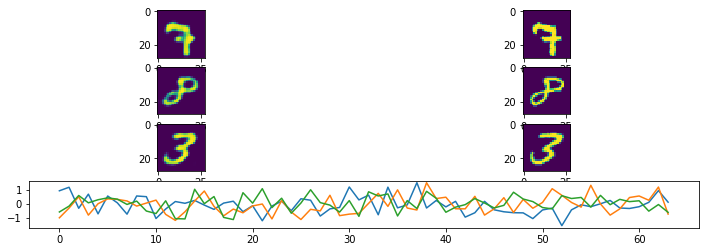

Epoch:  18 Iteration:  0 Loss:  87.100075 70.505585 16.594494


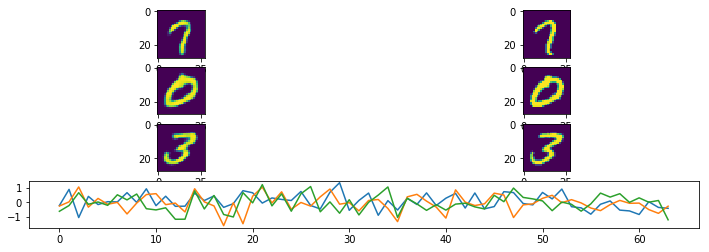

Epoch:  18 Iteration:  200 Loss:  85.792244 69.014755 16.777489


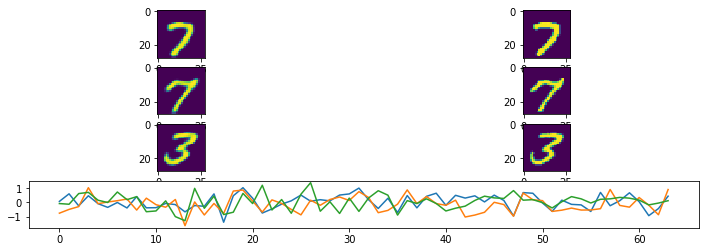

Epoch:  18 Iteration:  400 Loss:  84.88475 68.2368 16.647942


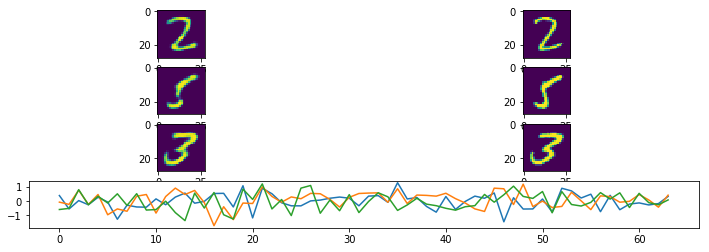

Epoch:  19 Iteration:  0 Loss:  86.59544 69.607475 16.987968


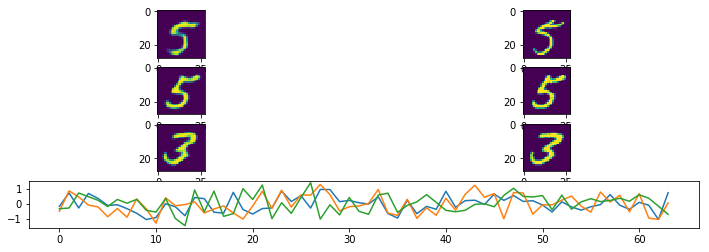

Epoch:  19 Iteration:  200 Loss:  85.30229 68.38957 16.912727


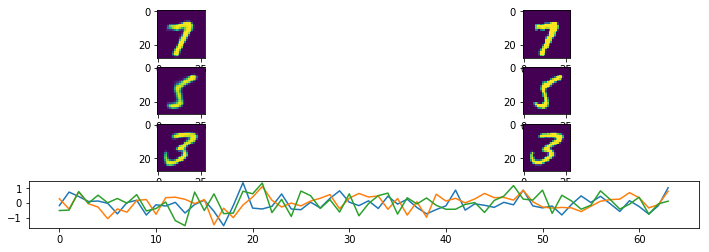

Epoch:  19 Iteration:  400 Loss:  84.48821 67.9422 16.546007


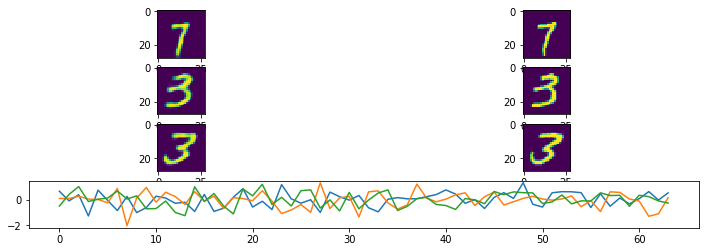

Epoch:  20 Iteration:  0 Loss:  86.457726 69.72397 16.733759


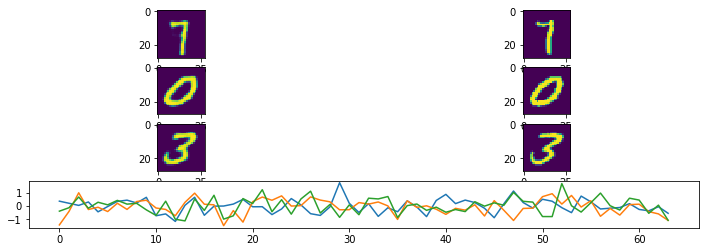

Epoch:  20 Iteration:  200 Loss:  84.97573 68.1957 16.780022


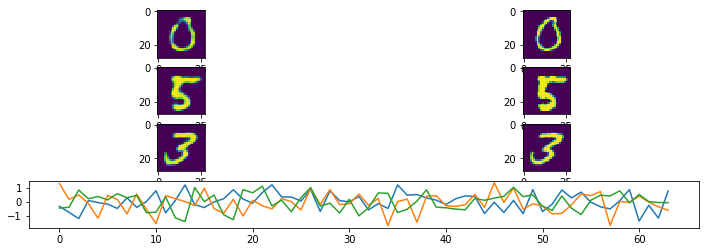

Epoch:  20 Iteration:  400 Loss:  83.63894 67.09836 16.540585


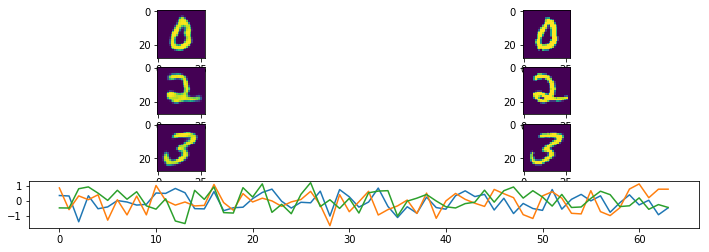

Epoch:  21 Iteration:  0 Loss:  85.21581 68.430374 16.785439


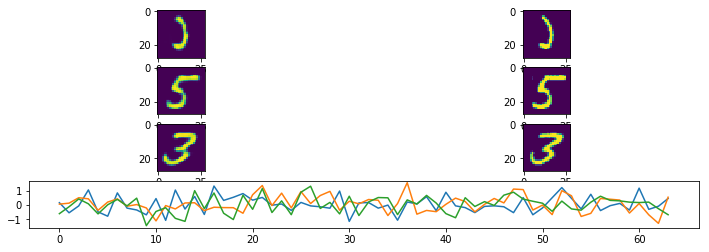

Epoch:  21 Iteration:  200 Loss:  84.94255 68.351204 16.591354


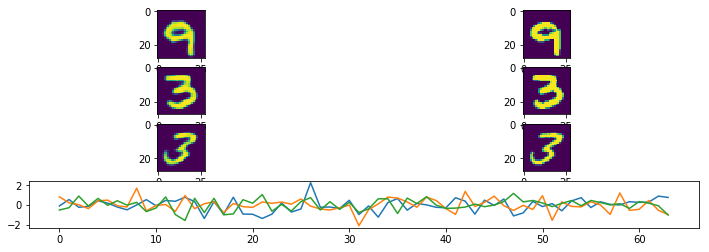

Epoch:  21 Iteration:  400 Loss:  83.91257 67.3418 16.570766


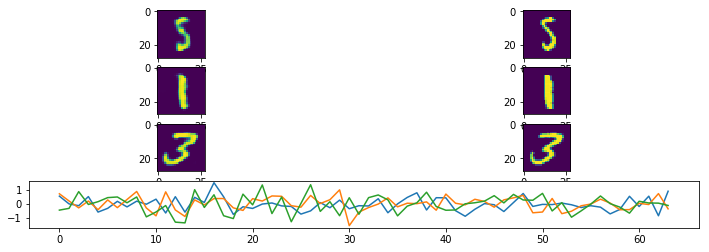

Epoch:  22 Iteration:  0 Loss:  85.37549 68.75623 16.619259


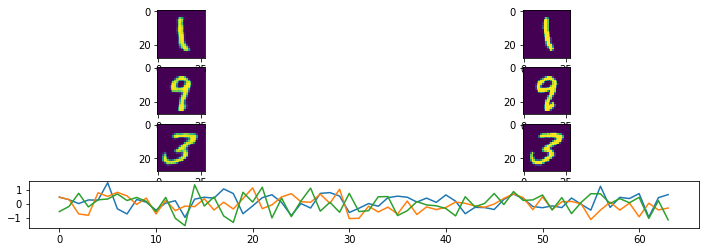

Epoch:  22 Iteration:  200 Loss:  84.8284 68.365005 16.463396


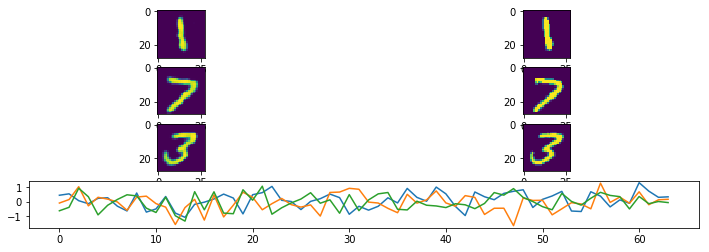

Epoch:  22 Iteration:  400 Loss:  83.795876 67.282364 16.513514


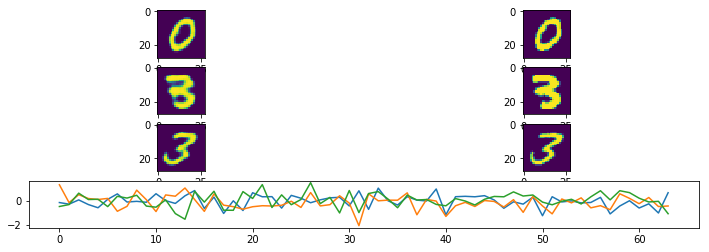

Epoch:  23 Iteration:  0 Loss:  85.217255 68.488014 16.729233


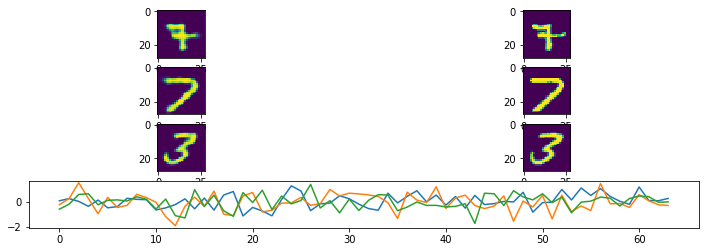

Epoch:  23 Iteration:  200 Loss:  84.73828 68.08745 16.650833


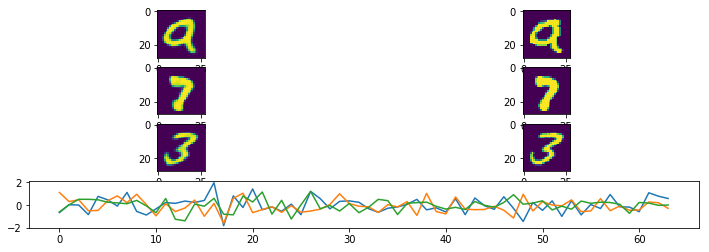

Epoch:  23 Iteration:  400 Loss:  83.01111 66.31771 16.693396


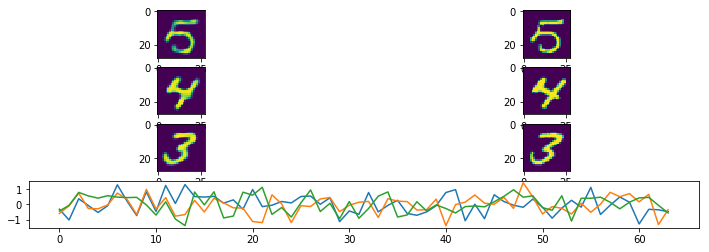

Epoch:  24 Iteration:  0 Loss:  85.028625 68.35562 16.673008


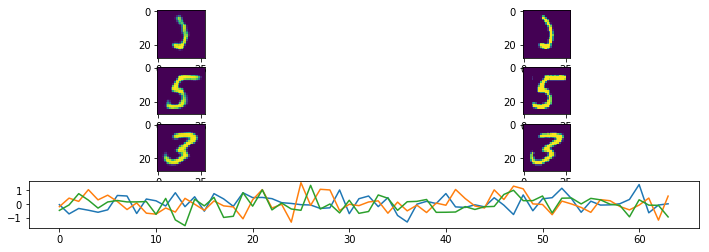

Epoch:  24 Iteration:  200 Loss:  84.44236 67.89548 16.54689


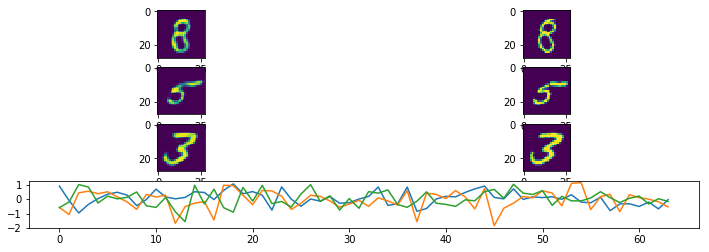

Epoch:  24 Iteration:  400 Loss:  83.33098 66.90578 16.425209


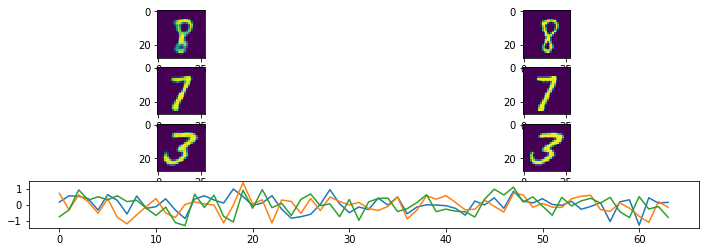

Epoch:  25 Iteration:  0 Loss:  84.87047 68.14662 16.723843


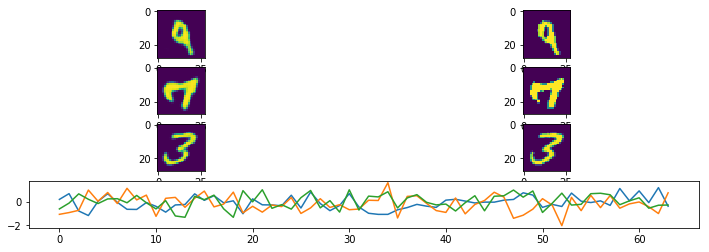

Epoch:  25 Iteration:  200 Loss:  83.70024 67.27173 16.428516


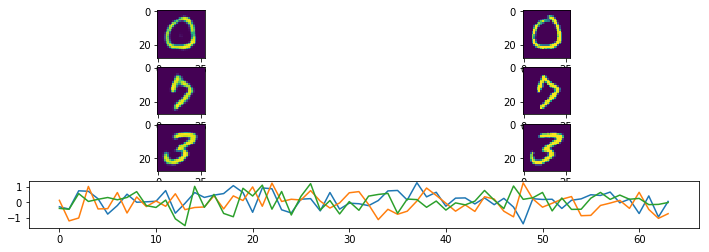

Epoch:  25 Iteration:  400 Loss:  82.381256 65.90755 16.473713


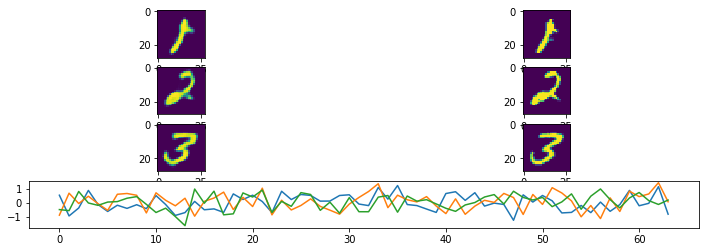

Epoch:  26 Iteration:  0 Loss:  84.32061 67.49308 16.827526


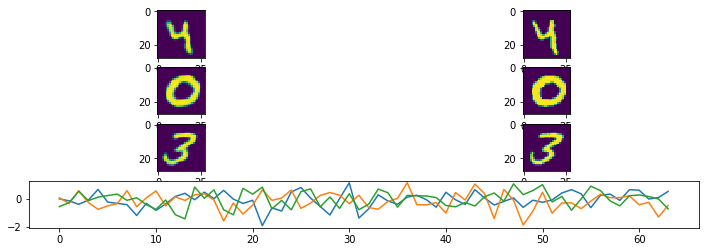

Epoch:  26 Iteration:  200 Loss:  82.913414 66.225945 16.687464


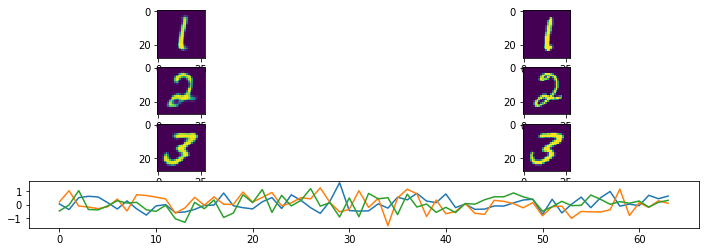

Epoch:  26 Iteration:  400 Loss:  82.734085 66.356155 16.37793


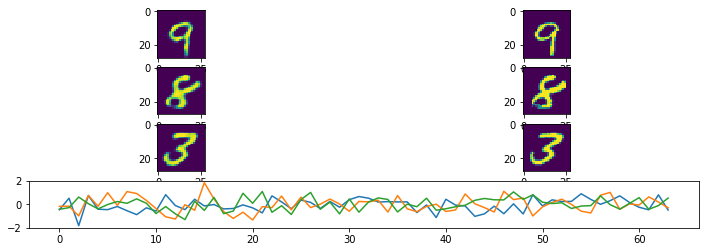

Epoch:  27 Iteration:  0 Loss:  84.24706 67.56318 16.683884


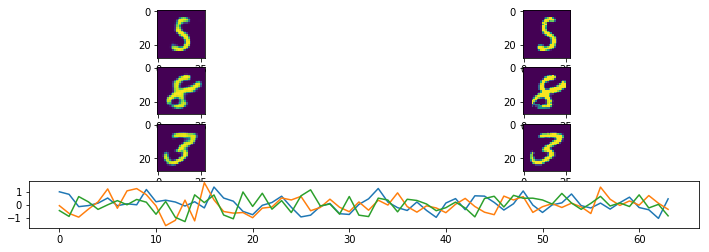

Epoch:  27 Iteration:  200 Loss:  83.367966 66.84773 16.520231


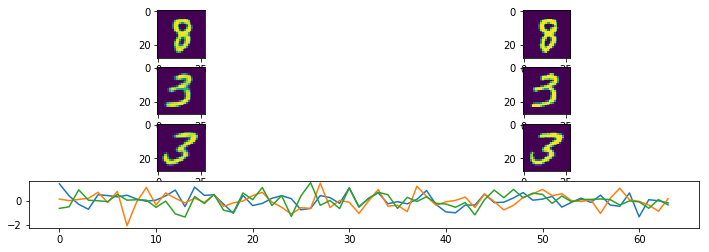

Epoch:  27 Iteration:  400 Loss:  82.66693 66.170654 16.496275


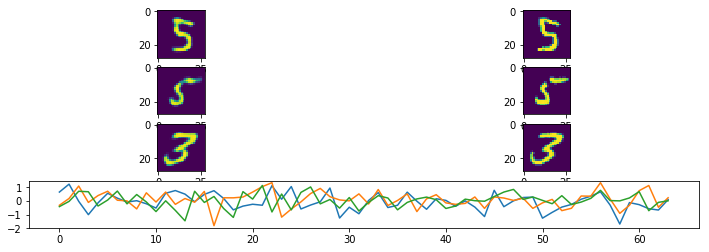

Epoch:  28 Iteration:  0 Loss:  83.63729 67.07518 16.562107


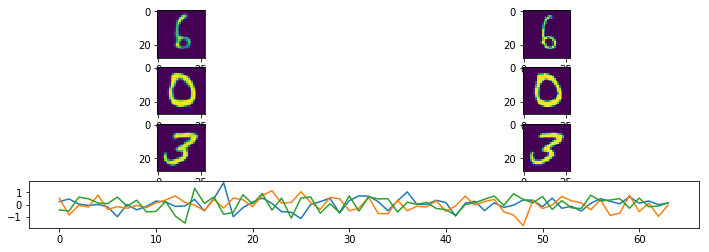

Epoch:  28 Iteration:  200 Loss:  83.47695 67.02623 16.450718


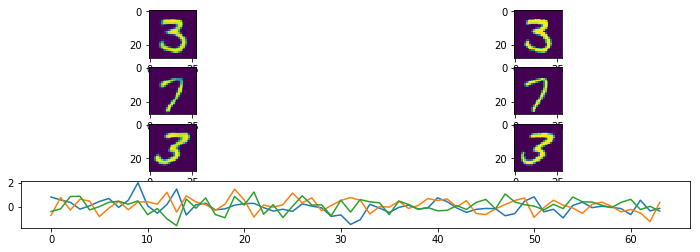

Epoch:  28 Iteration:  400 Loss:  82.541306 66.19234 16.348963


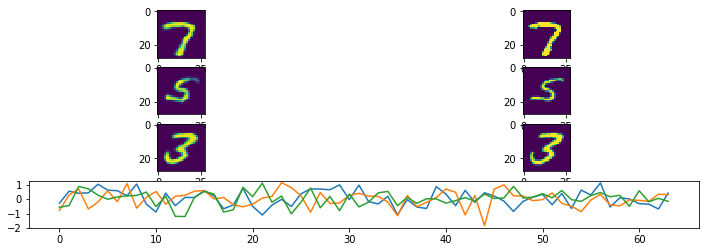

Epoch:  29 Iteration:  0 Loss:  83.94829 67.367035 16.581257


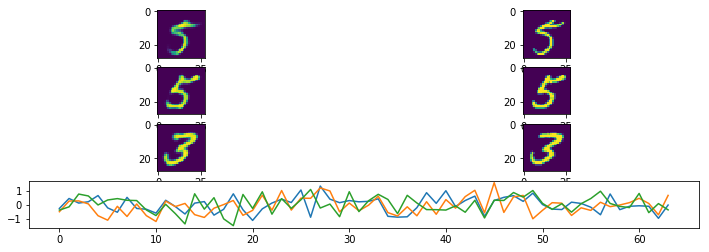

Epoch:  29 Iteration:  200 Loss:  83.0164 66.551056 16.465353


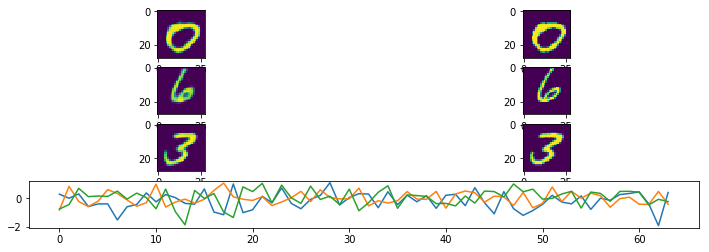

Epoch:  29 Iteration:  400 Loss:  82.02347 65.785835 16.23764


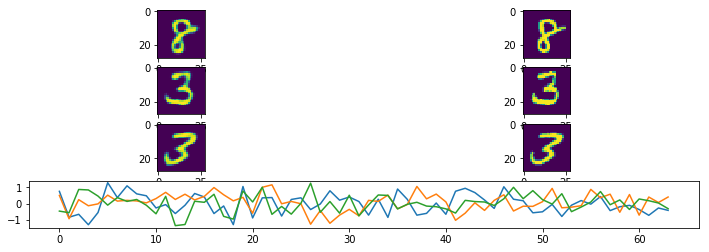

Epoch:  30 Iteration:  0 Loss:  83.76636 67.15875 16.607601


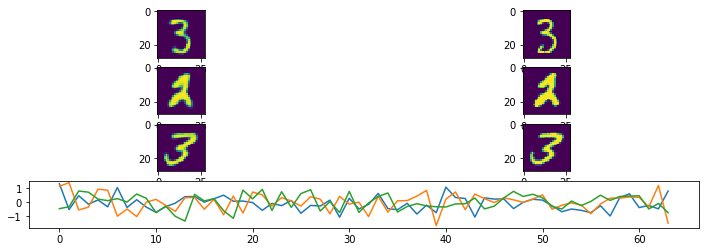

Epoch:  30 Iteration:  200 Loss:  82.56121 66.192 16.369211


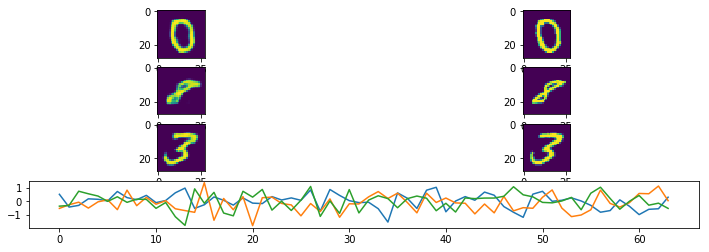

Epoch:  30 Iteration:  400 Loss:  82.433105 66.15901 16.274097


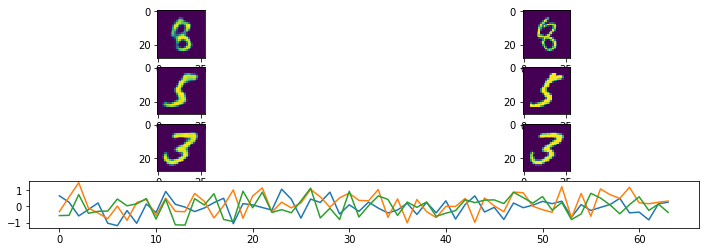

Epoch:  31 Iteration:  0 Loss:  82.899734 66.27785 16.621895


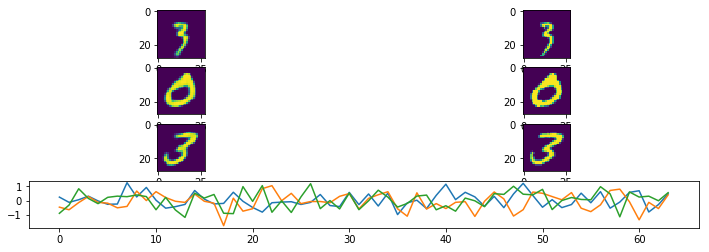

Epoch:  31 Iteration:  200 Loss:  82.980225 66.456985 16.52324


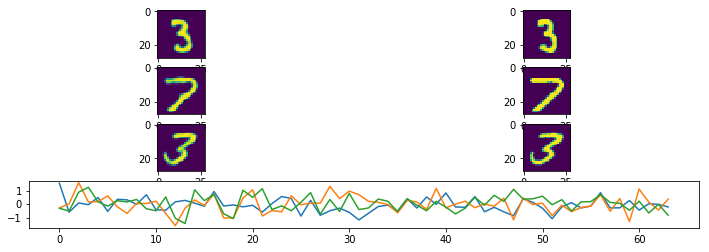

Epoch:  31 Iteration:  400 Loss:  82.34251 66.05156 16.29095


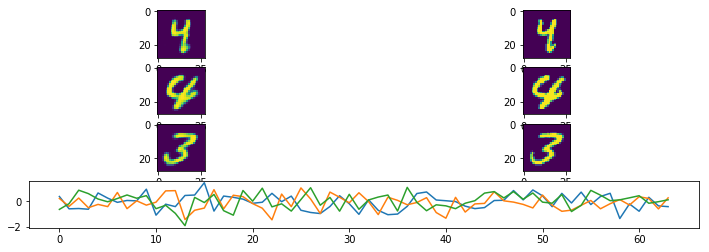

Epoch:  32 Iteration:  0 Loss:  83.19675 66.607864 16.58889


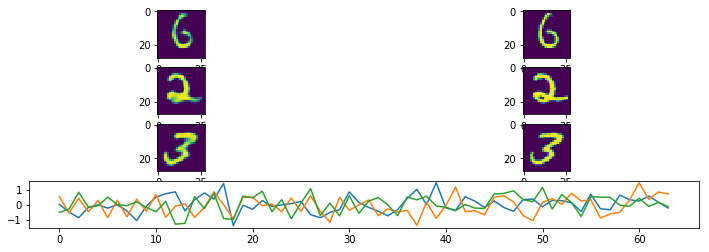

Epoch:  32 Iteration:  200 Loss:  82.73858 66.24887 16.489702


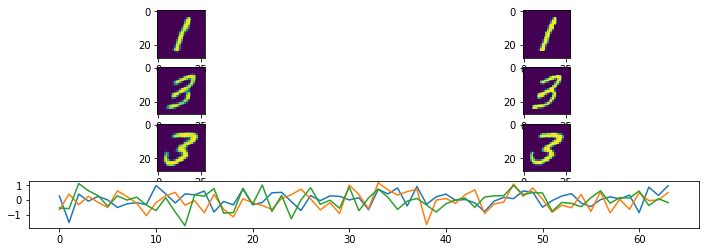

Epoch:  32 Iteration:  400 Loss:  81.534256 65.22894 16.305317


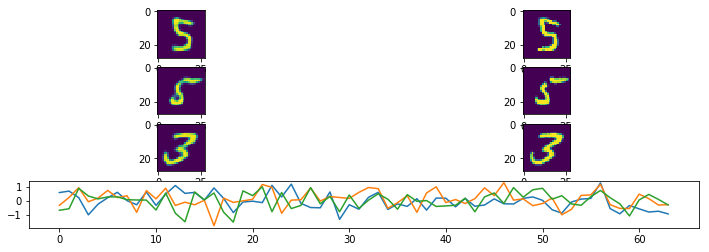

Epoch:  33 Iteration:  0 Loss:  83.43756 66.831245 16.606321


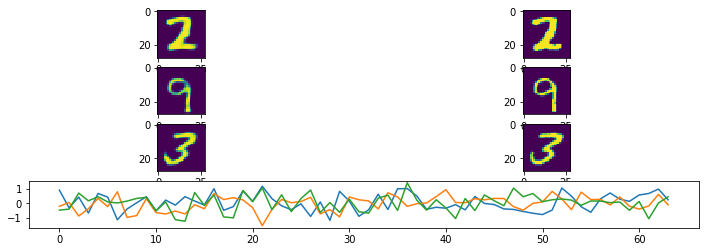

Epoch:  33 Iteration:  200 Loss:  82.531296 66.033264 16.498034


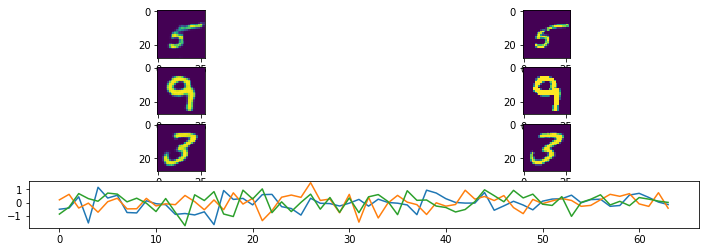

Epoch:  33 Iteration:  400 Loss:  82.08823 65.716354 16.371876


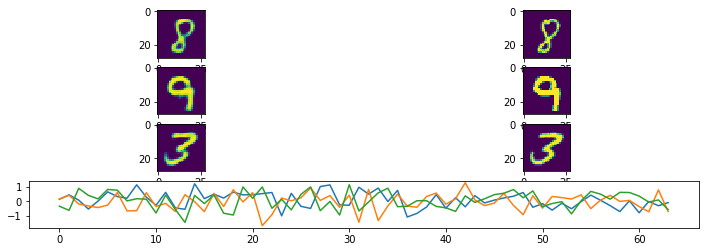

Epoch:  34 Iteration:  0 Loss:  83.330894 66.941666 16.389229


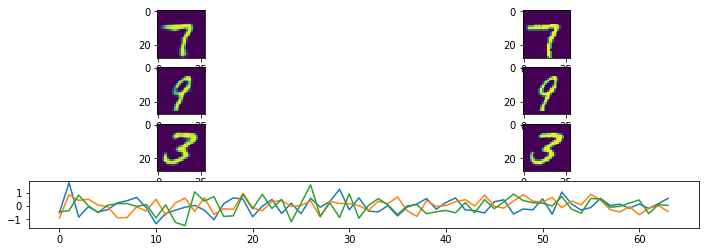

Epoch:  34 Iteration:  200 Loss:  82.31732 65.76451 16.552803


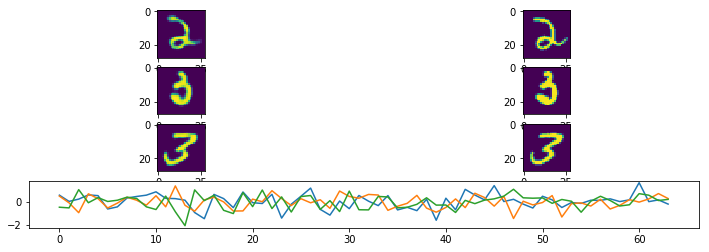

Epoch:  34 Iteration:  400 Loss:  81.84943 65.5143 16.335121


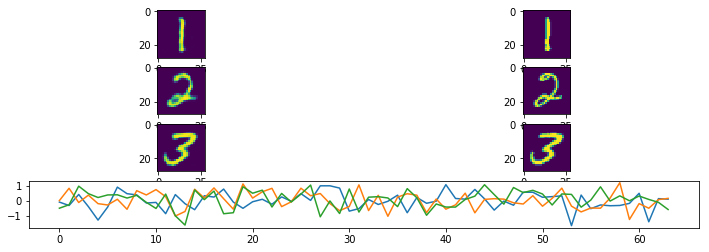

Epoch:  35 Iteration:  0 Loss:  83.13165 66.77262 16.359022


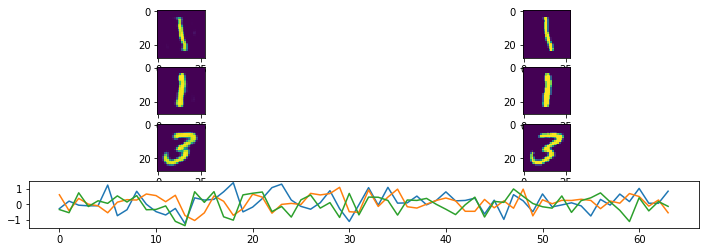

Epoch:  35 Iteration:  200 Loss:  82.22576 65.88925 16.336508


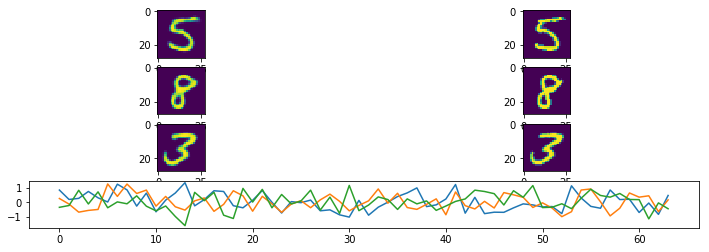

Epoch:  35 Iteration:  400 Loss:  81.68947 65.45246 16.237005


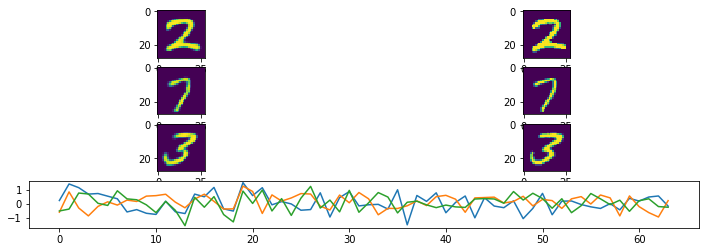

Epoch:  36 Iteration:  0 Loss:  83.20171 66.7056 16.496113


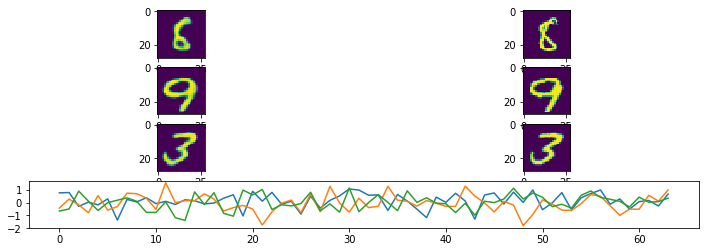

Epoch:  36 Iteration:  200 Loss:  82.19646 65.63762 16.558846


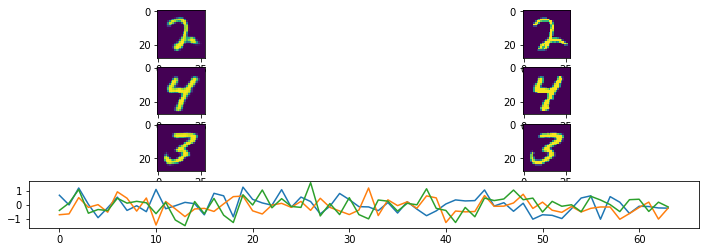

Epoch:  36 Iteration:  400 Loss:  81.56272 65.5182 16.044518


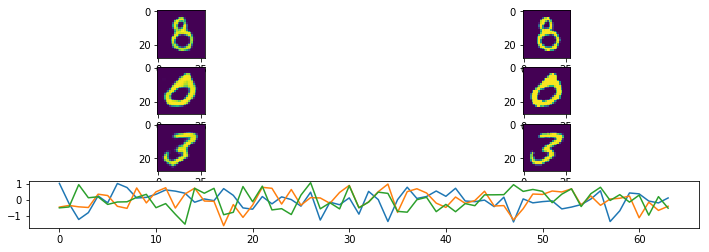

Epoch:  37 Iteration:  0 Loss:  82.78436 66.3336 16.45076


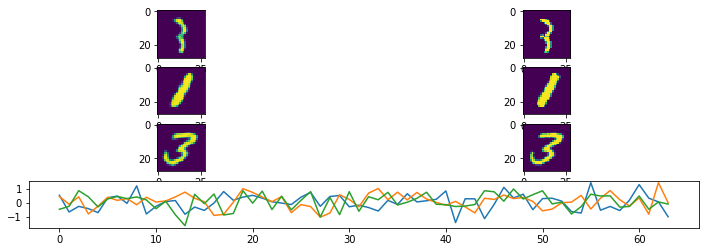

Epoch:  37 Iteration:  200 Loss:  82.28265 65.96152 16.32114


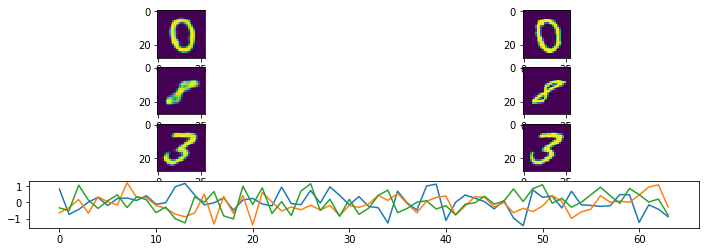

Epoch:  37 Iteration:  400 Loss:  81.13268 64.71794 16.414742


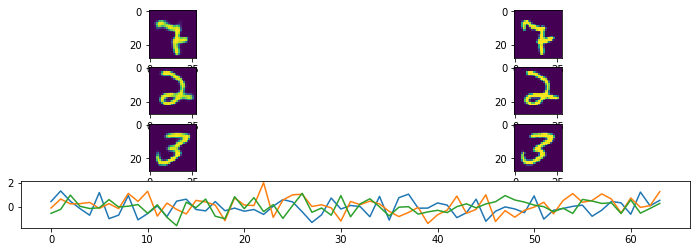

Epoch:  38 Iteration:  0 Loss:  82.87373 66.363495 16.510237


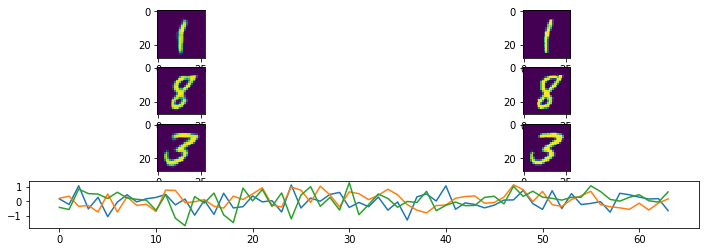

Epoch:  38 Iteration:  200 Loss:  81.98829 65.64298 16.345303


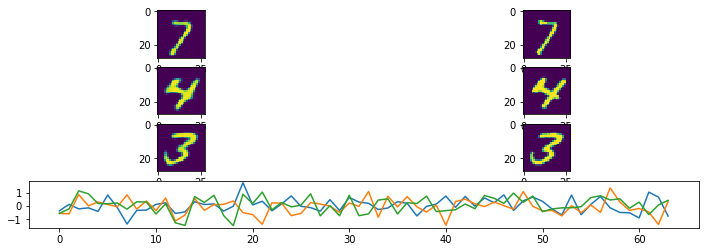

Epoch:  38 Iteration:  400 Loss:  81.30818 65.130325 16.17786


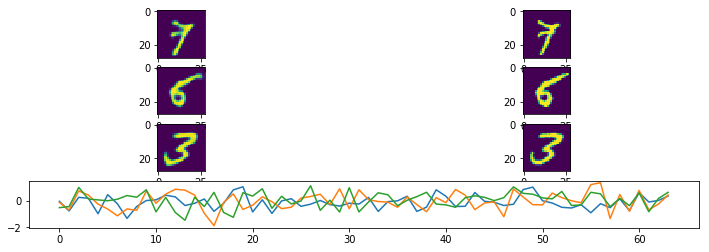

Epoch:  39 Iteration:  0 Loss:  82.60899 66.09276 16.51624


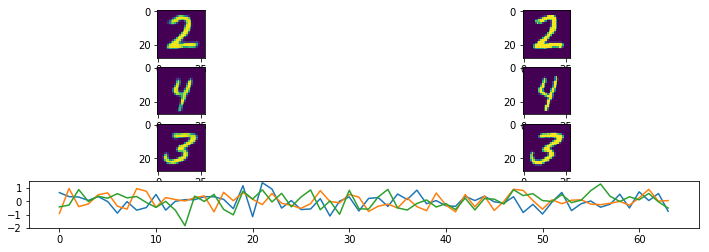

Epoch:  39 Iteration:  200 Loss:  81.82912 65.38647 16.44265


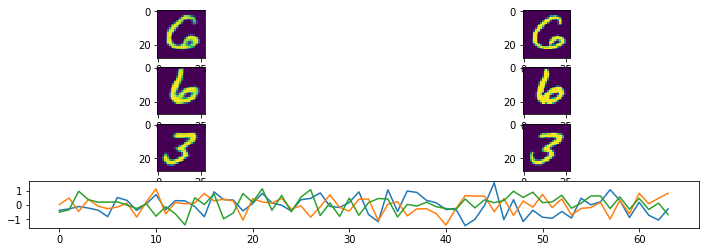

Epoch:  39 Iteration:  400 Loss:  80.922966 64.77305 16.149918


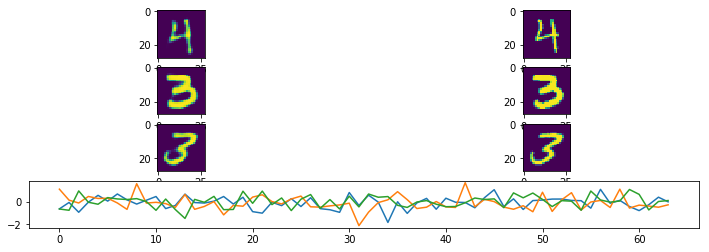

Epoch:  40 Iteration:  0 Loss:  82.40668 66.016304 16.390375


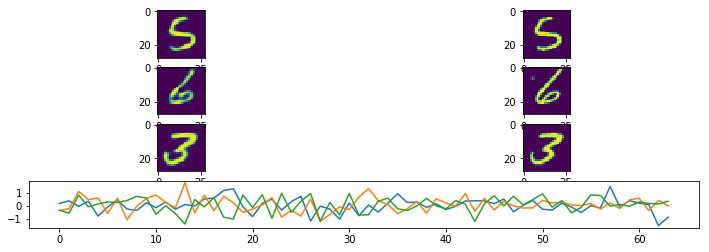

Epoch:  40 Iteration:  200 Loss:  81.59116 65.23836 16.352806


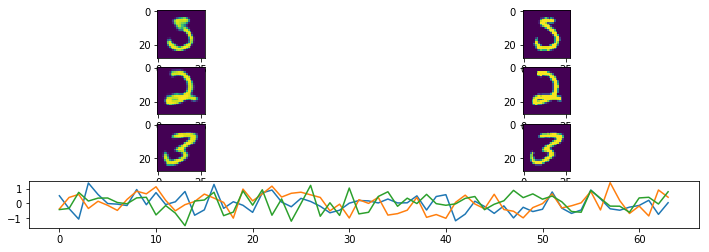

Epoch:  40 Iteration:  400 Loss:  80.964966 64.74852 16.216454


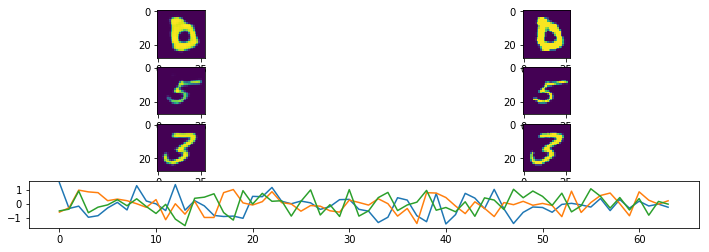

Epoch:  41 Iteration:  0 Loss:  82.801956 66.47521 16.326742


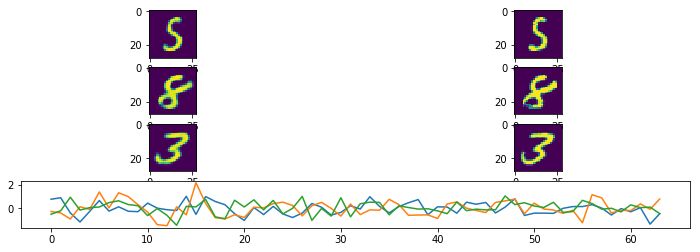

Epoch:  41 Iteration:  200 Loss:  81.39572 65.132835 16.262882


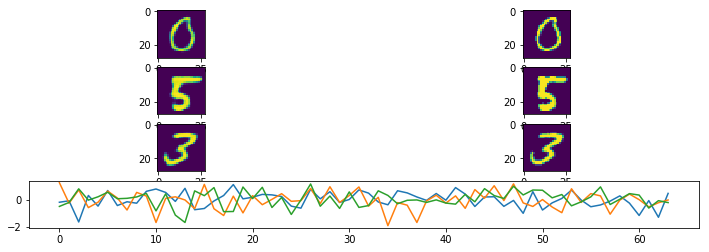

Epoch:  41 Iteration:  400 Loss:  80.69271 64.51095 16.181759


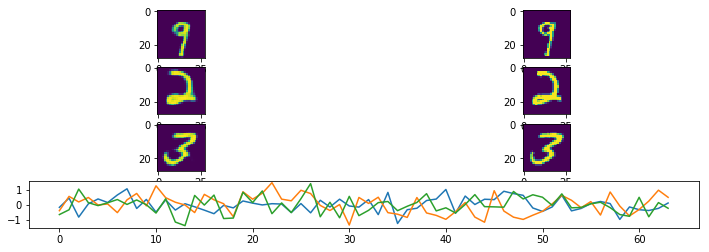

Epoch:  42 Iteration:  0 Loss:  81.71501 65.17712 16.537895


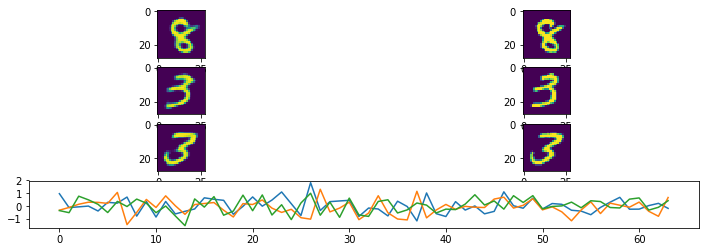

Epoch:  42 Iteration:  200 Loss:  81.16115 64.8244 16.336754


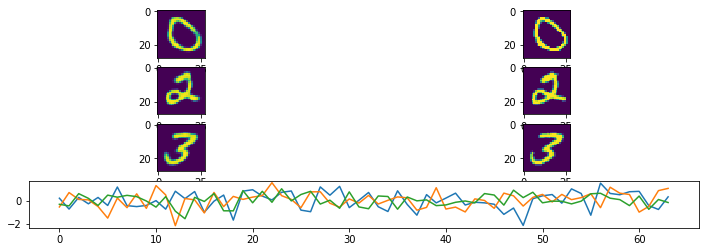

Epoch:  42 Iteration:  400 Loss:  80.494576 64.340744 16.153828


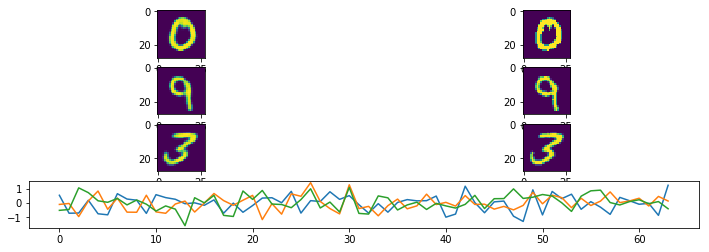

Epoch:  43 Iteration:  0 Loss:  81.92183 65.43618 16.485653


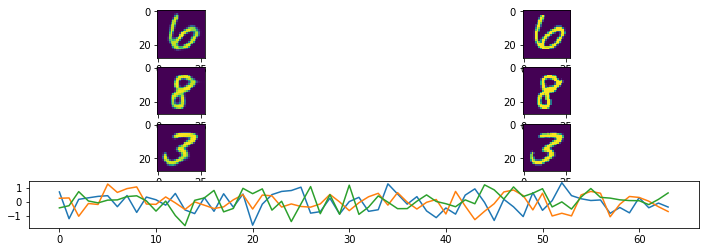

Epoch:  43 Iteration:  200 Loss:  81.68074 65.43047 16.25026


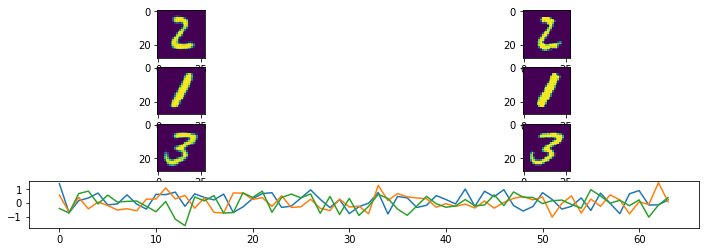

Epoch:  43 Iteration:  400 Loss:  80.48572 64.21928 16.266438


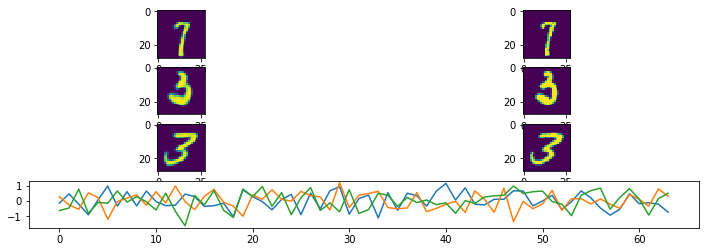

Epoch:  44 Iteration:  0 Loss:  82.008 65.7272 16.280796


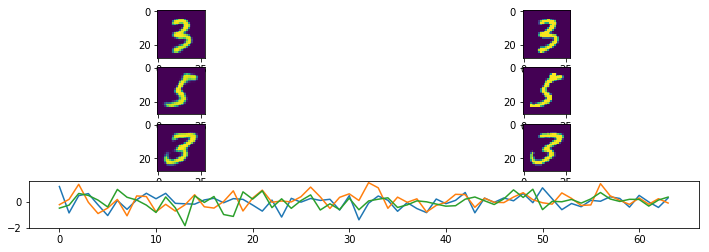

Epoch:  44 Iteration:  200 Loss:  81.30252 65.026436 16.276077


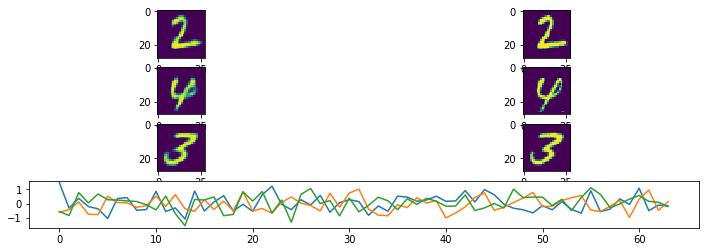

Epoch:  44 Iteration:  400 Loss:  80.59909 64.48462 16.114477


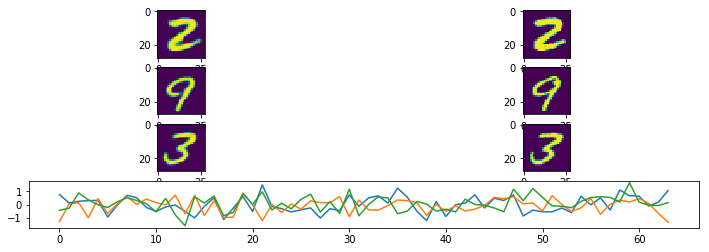

Epoch:  45 Iteration:  0 Loss:  81.90463 65.54834 16.356285


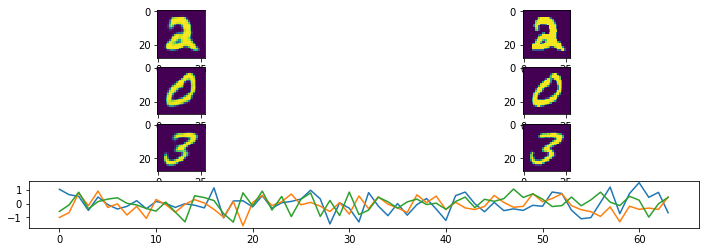

Epoch:  45 Iteration:  200 Loss:  81.20503 65.032364 16.17267


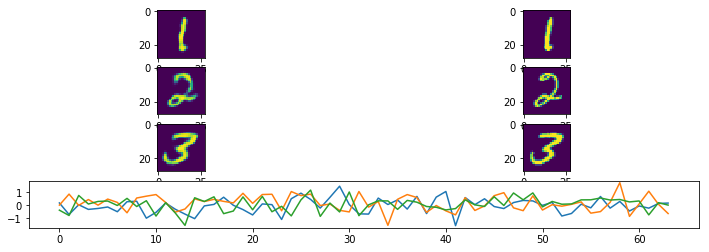

Epoch:  45 Iteration:  400 Loss:  80.92235 64.98271 15.939642


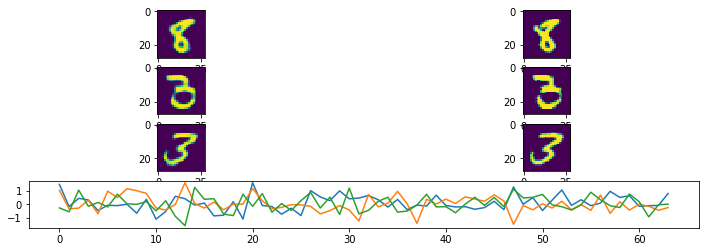

Epoch:  46 Iteration:  0 Loss:  81.931244 65.50861 16.422625


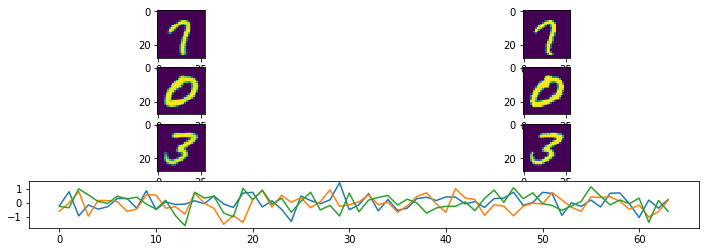

Epoch:  46 Iteration:  200 Loss:  81.50951 65.279015 16.230492


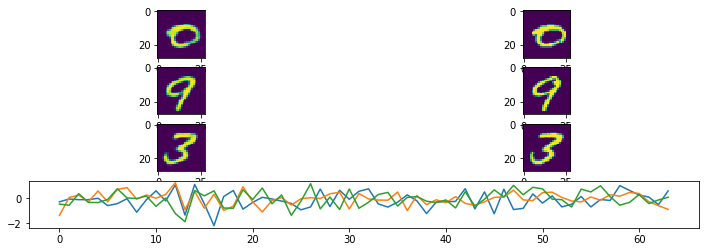

Epoch:  46 Iteration:  400 Loss:  80.55913 64.43878 16.12035


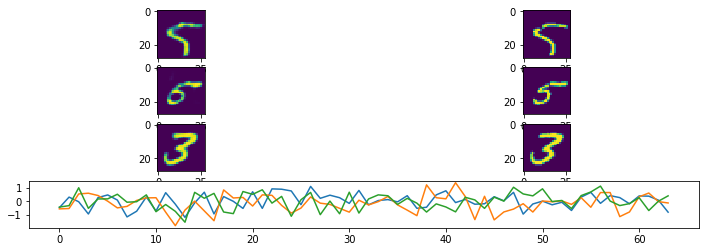

Epoch:  47 Iteration:  0 Loss:  81.842834 65.68712 16.15572


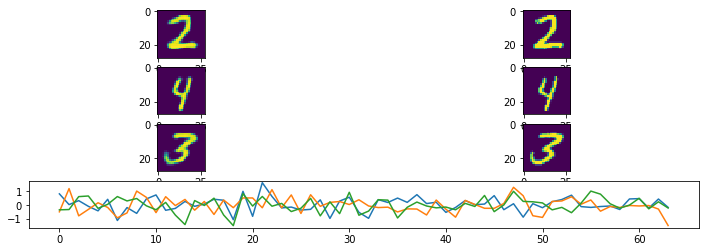

Epoch:  47 Iteration:  200 Loss:  81.16316 64.9276 16.235563


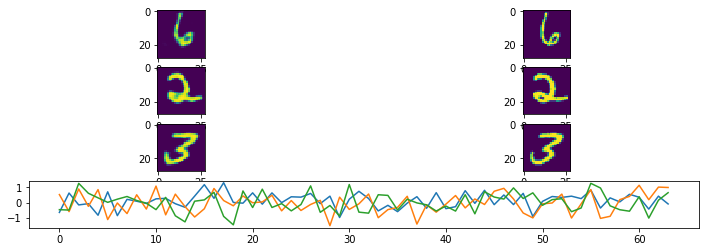

Epoch:  47 Iteration:  400 Loss:  80.20709 64.10238 16.104712


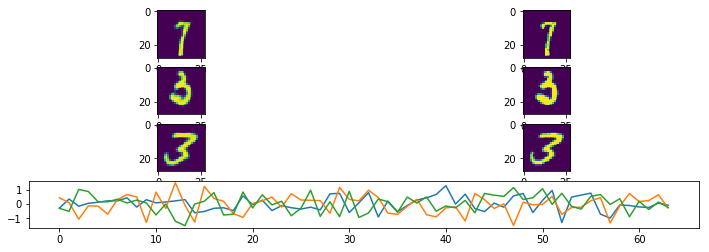

Epoch:  48 Iteration:  0 Loss:  81.769066 65.51499 16.254074


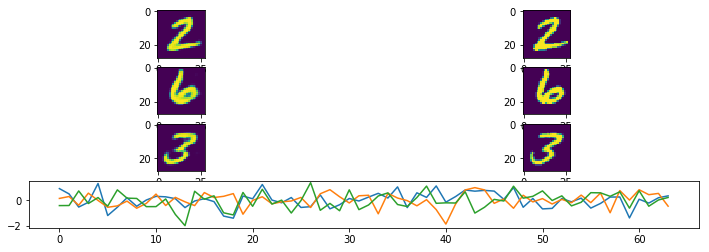

Epoch:  48 Iteration:  200 Loss:  80.6982 64.444855 16.253344


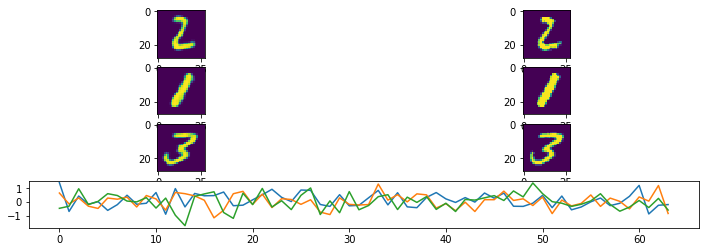

Epoch:  48 Iteration:  400 Loss:  80.6099 64.48176 16.12814


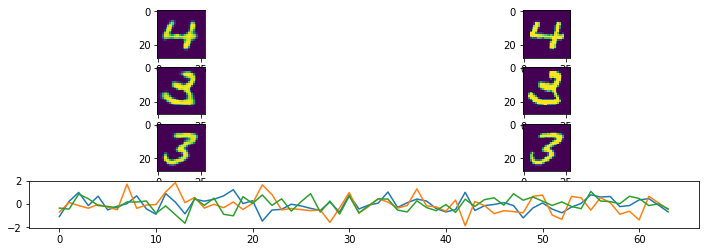

Epoch:  49 Iteration:  0 Loss:  81.433846 65.14253 16.291313


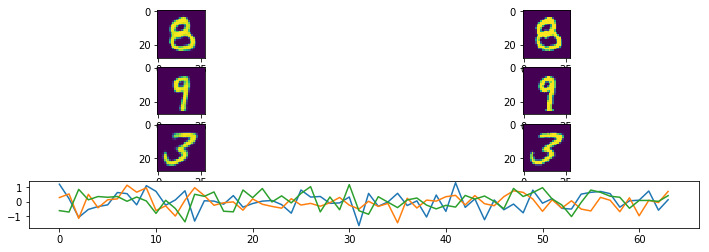

Epoch:  49 Iteration:  200 Loss:  81.44322 65.103165 16.340057


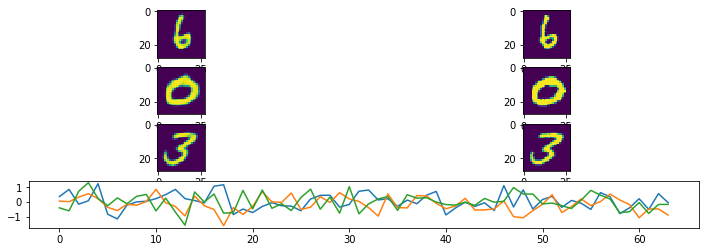

Epoch:  49 Iteration:  400 Loss:  80.698166 64.55174 16.146412


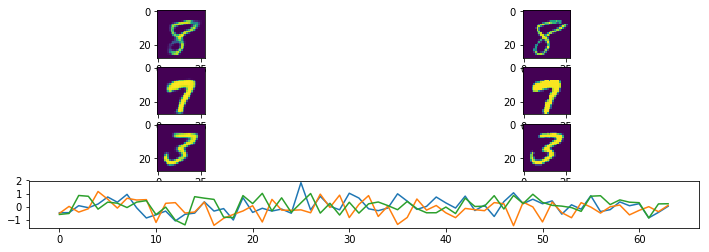

Epoch:  50 Iteration:  0 Loss:  81.5648 65.26431 16.300486


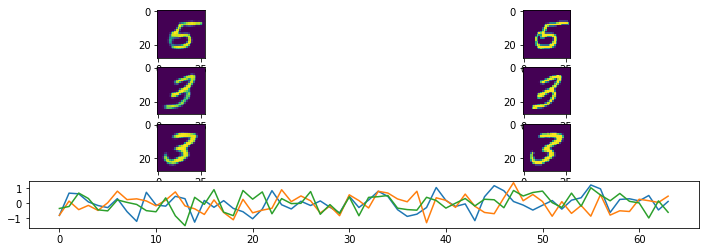

Epoch:  50 Iteration:  200 Loss:  80.587395 64.36714 16.220253


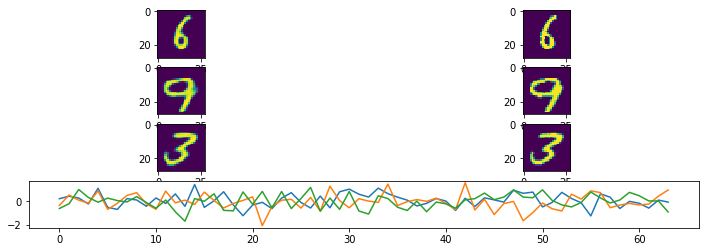

Epoch:  50 Iteration:  400 Loss:  80.37332 64.33293 16.040396


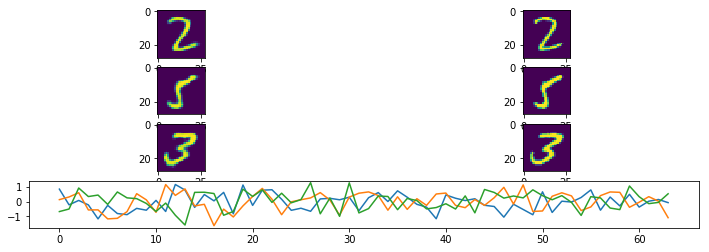

Epoch:  51 Iteration:  0 Loss:  81.76535 65.565315 16.200031


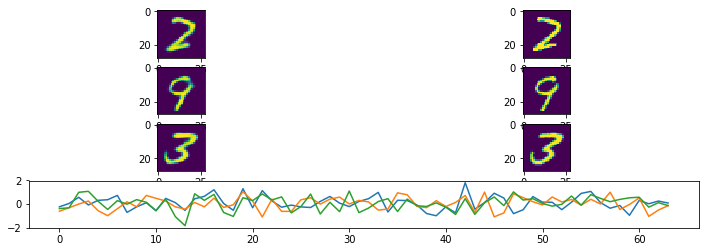

Epoch:  51 Iteration:  200 Loss:  80.710655 64.617134 16.093525


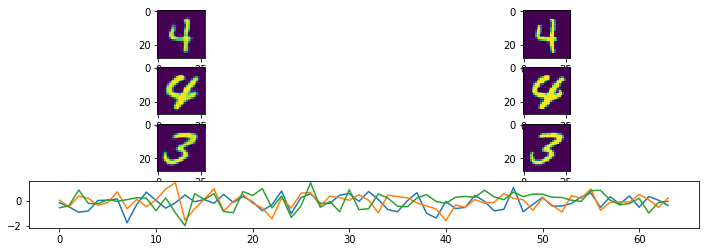

Epoch:  51 Iteration:  400 Loss:  79.99527 64.077225 15.918049


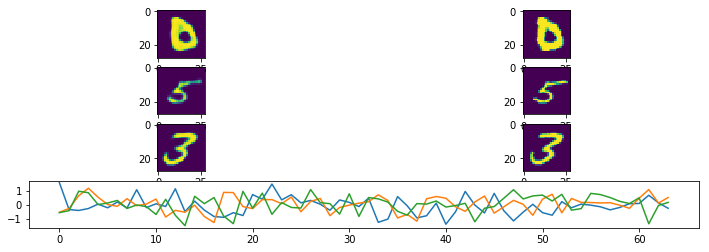

Epoch:  52 Iteration:  0 Loss:  81.359085 65.16673 16.192345


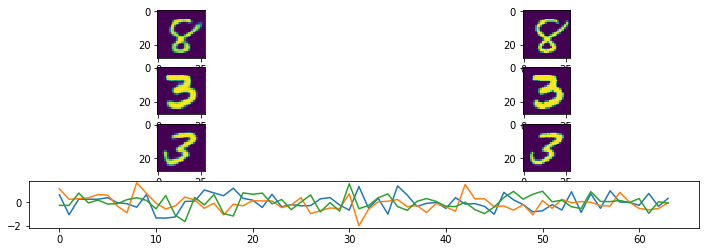

Epoch:  52 Iteration:  200 Loss:  80.471375 64.32139 16.149988


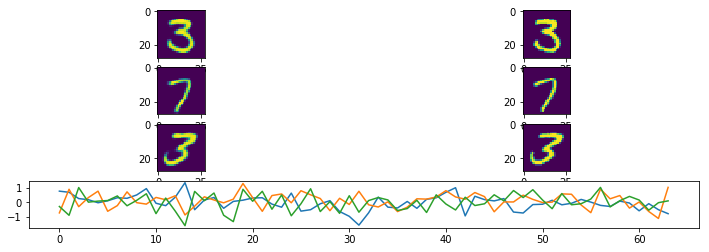

Epoch:  52 Iteration:  400 Loss:  79.93527 63.88544 16.049828


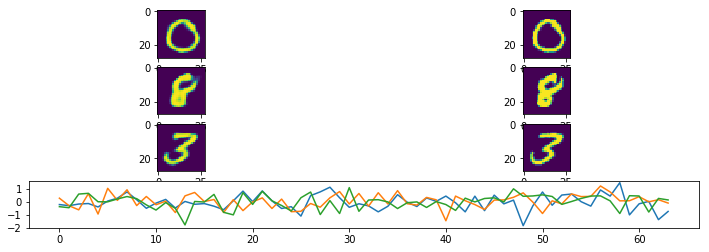

Epoch:  53 Iteration:  0 Loss:  81.51823 65.35327 16.164955


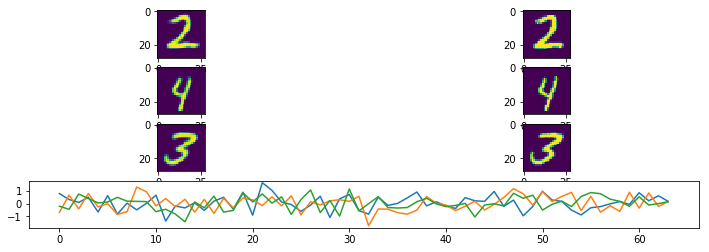

Epoch:  53 Iteration:  200 Loss:  80.249565 64.07464 16.174929


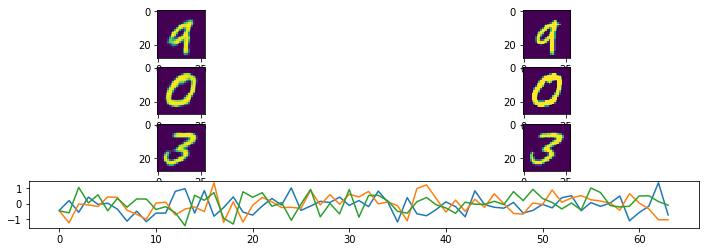

Epoch:  53 Iteration:  400 Loss:  79.911835 63.9392 15.972635


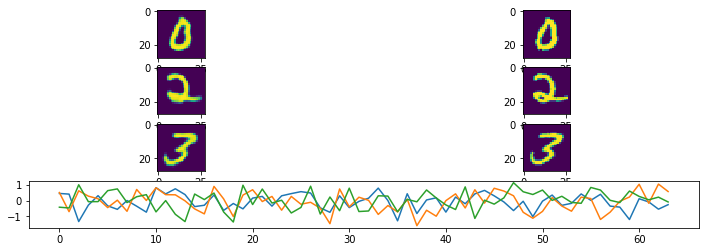

Epoch:  54 Iteration:  0 Loss:  80.79776 64.503555 16.294203


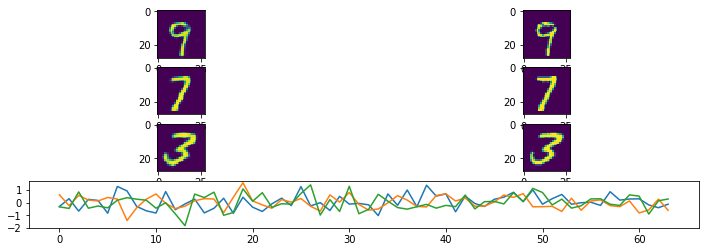

Epoch:  54 Iteration:  200 Loss:  80.68611 64.47351 16.212597


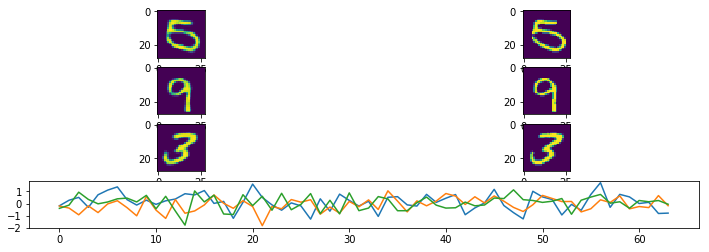

Epoch:  54 Iteration:  400 Loss:  79.83787 63.77656 16.061306


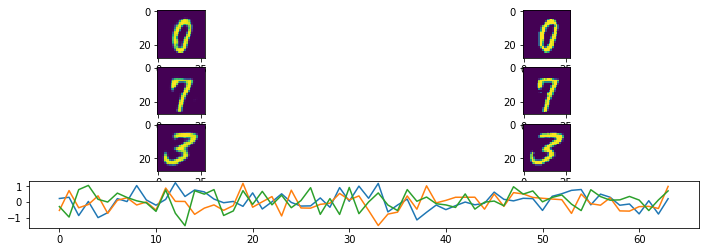

Epoch:  55 Iteration:  0 Loss:  81.104675 64.74146 16.363213


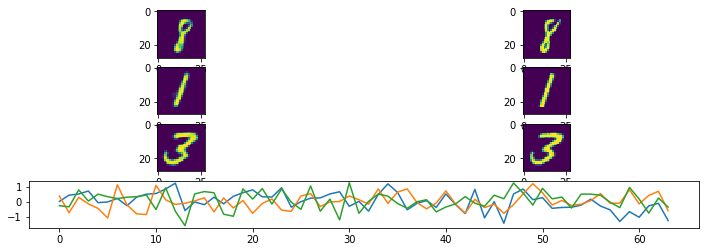

Epoch:  55 Iteration:  200 Loss:  80.76233 64.73686 16.025457


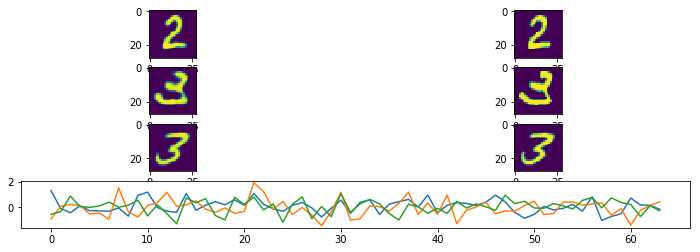

Epoch:  55 Iteration:  400 Loss:  79.47565 63.486004 15.989639


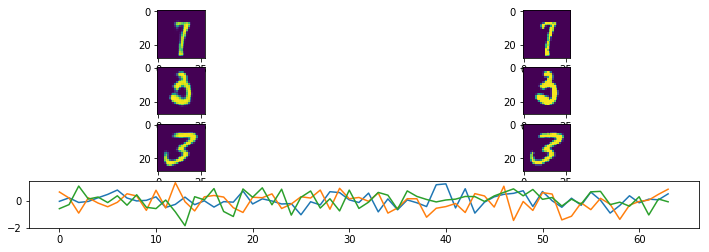

Epoch:  56 Iteration:  0 Loss:  80.86604 64.52682 16.339226


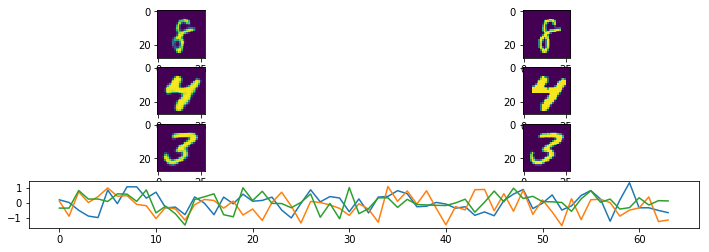

Epoch:  56 Iteration:  200 Loss:  80.5446 64.49052 16.054089


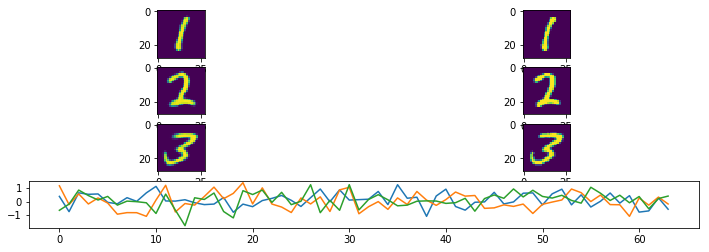

Epoch:  56 Iteration:  400 Loss:  80.19803 64.129036 16.068995


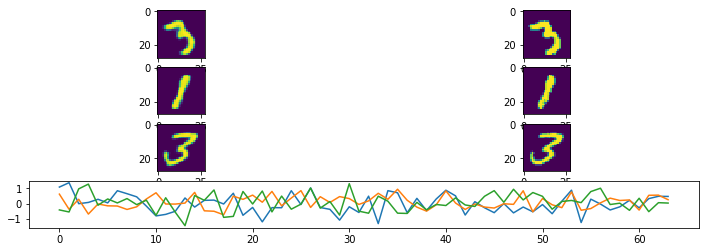

Epoch:  57 Iteration:  0 Loss:  81.05926 64.75429 16.304974


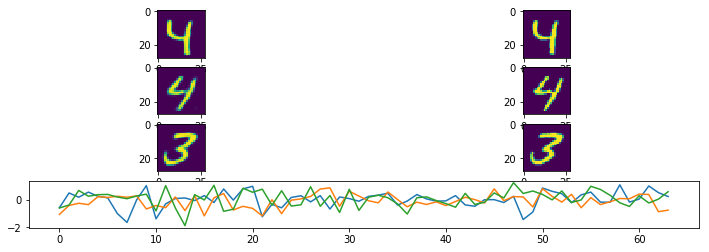

Epoch:  57 Iteration:  200 Loss:  80.32823 64.13975 16.188486


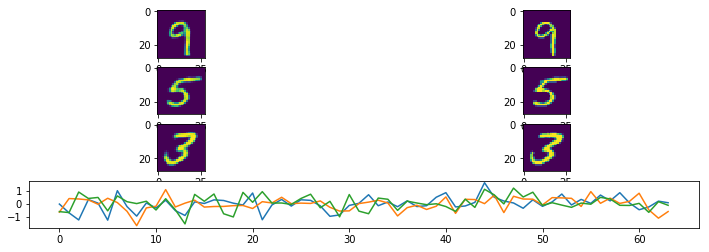

Epoch:  57 Iteration:  400 Loss:  79.67302 63.502636 16.170383


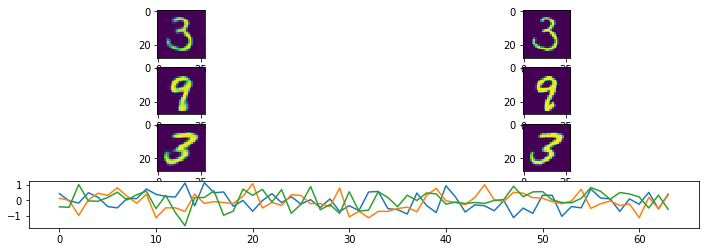

Epoch:  58 Iteration:  0 Loss:  80.75386 64.53527 16.21859


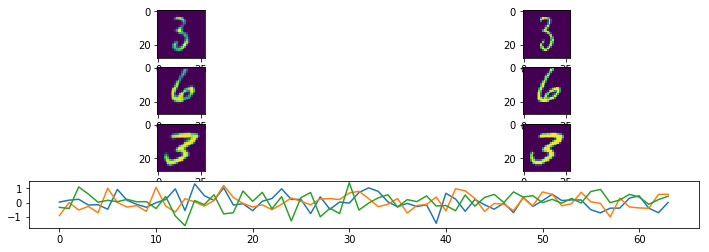

Epoch:  58 Iteration:  200 Loss:  80.408356 64.29522 16.113142


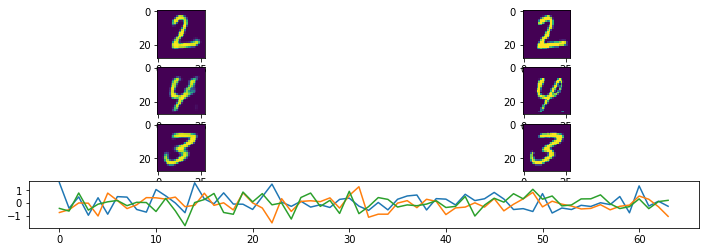

Epoch:  58 Iteration:  400 Loss:  79.65567 63.62824 16.027433


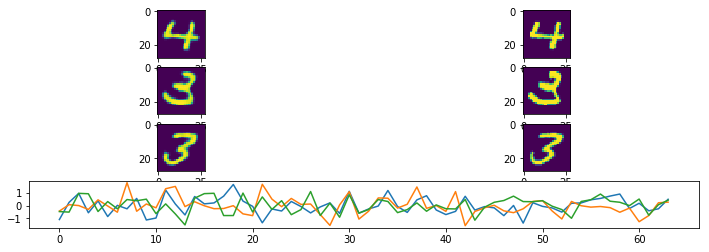

Epoch:  59 Iteration:  0 Loss:  81.078384 64.79706 16.28133


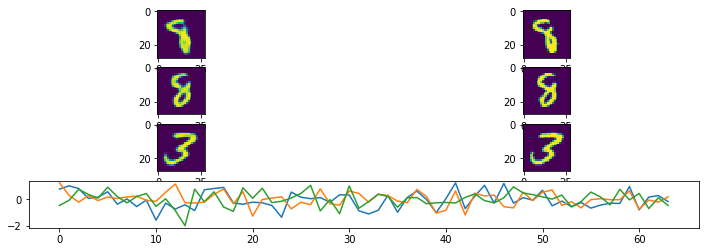

Epoch:  59 Iteration:  200 Loss:  80.13687 64.10605 16.030815


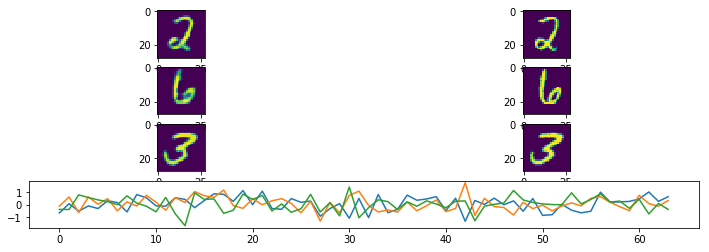

Epoch:  59 Iteration:  400 Loss:  80.380226 64.2767 16.103523


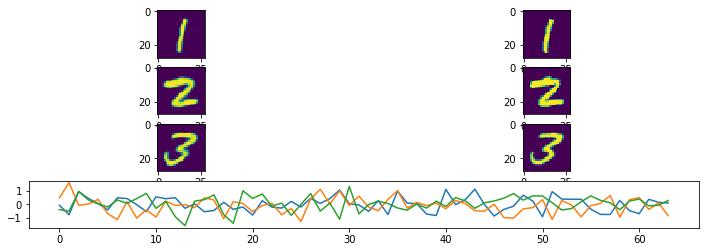

Epoch:  60 Iteration:  0 Loss:  81.48441 65.367294 16.11711


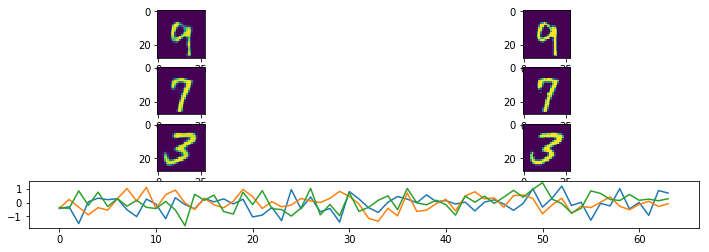

Epoch:  60 Iteration:  200 Loss:  79.691986 63.59191 16.10007


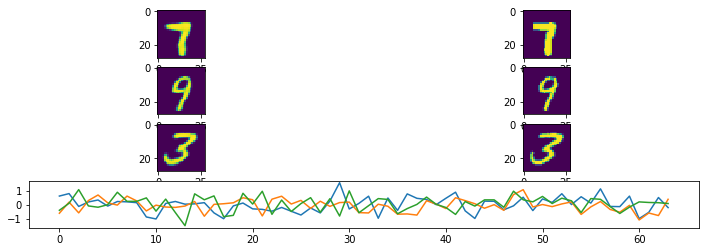

Epoch:  60 Iteration:  400 Loss:  79.36344 63.49514 15.868303


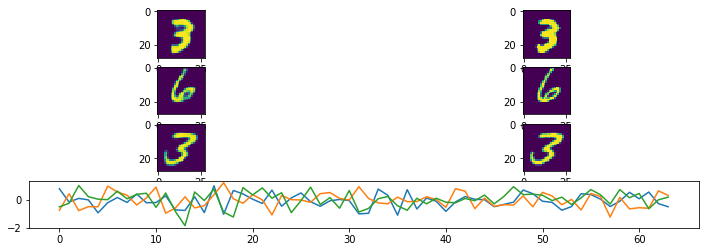

Epoch:  61 Iteration:  0 Loss:  81.37987 65.11869 16.261183


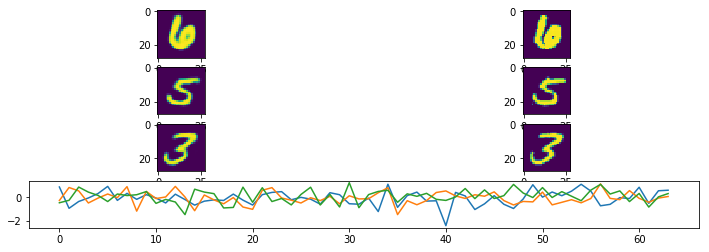

Epoch:  61 Iteration:  200 Loss:  79.77875 63.732353 16.046392


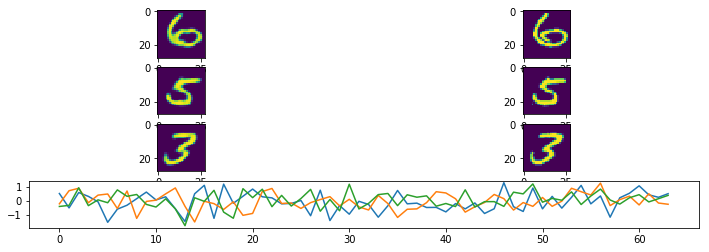

Epoch:  61 Iteration:  400 Loss:  79.57346 63.59282 15.980648


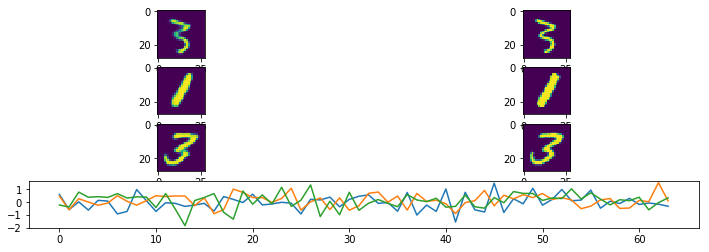

Epoch:  62 Iteration:  0 Loss:  80.80341 64.66621 16.137205


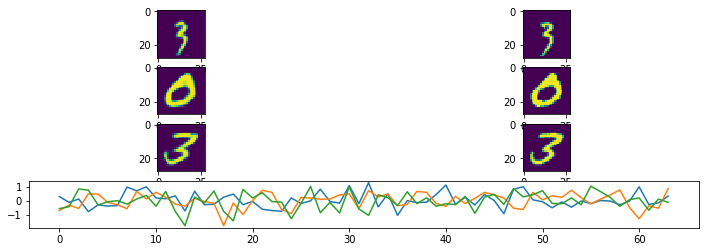

Epoch:  62 Iteration:  200 Loss:  80.541046 64.51651 16.024532


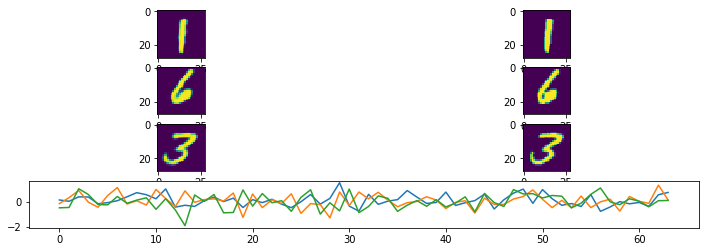

Epoch:  62 Iteration:  400 Loss:  79.58537 63.685764 15.899614


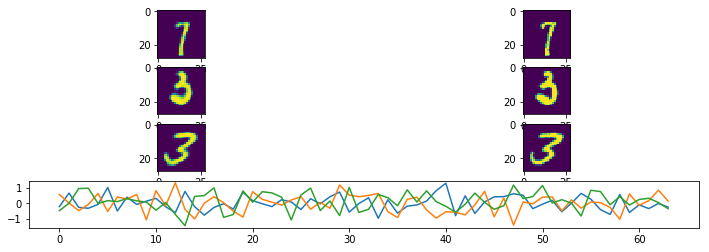

Epoch:  63 Iteration:  0 Loss:  80.251144 64.21618 16.034964


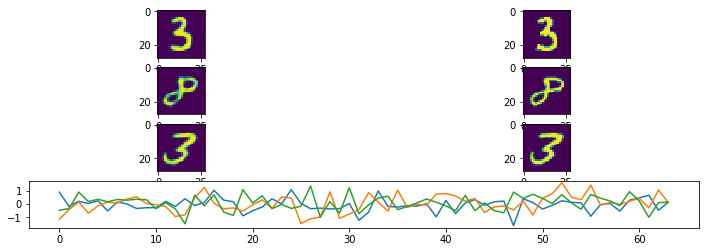

Epoch:  63 Iteration:  200 Loss:  80.19268 64.20915 15.983532


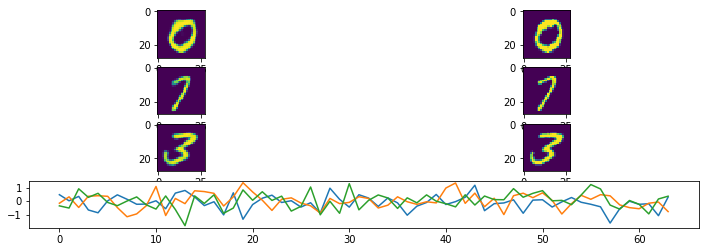

Epoch:  63 Iteration:  400 Loss:  79.27781 63.42302 15.854792


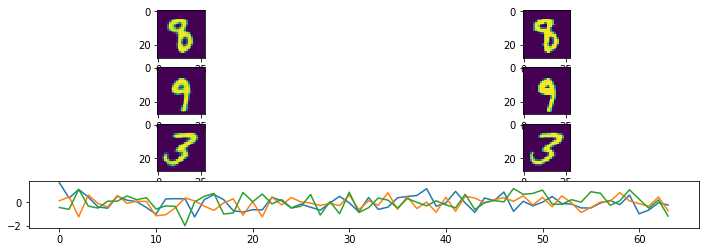

Epoch:  64 Iteration:  0 Loss:  80.89814 64.68352 16.21463


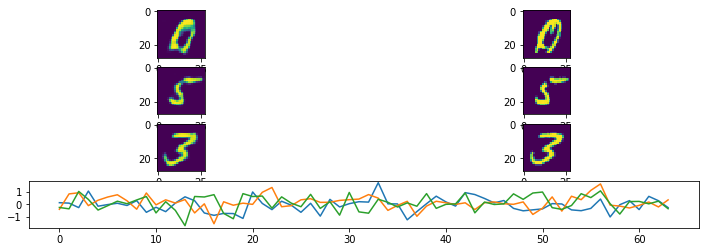

Epoch:  64 Iteration:  200 Loss:  79.89899 63.91634 15.982648


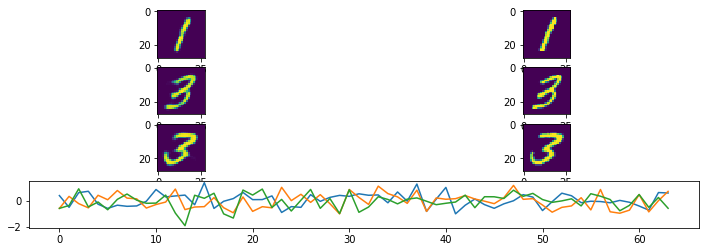

Epoch:  64 Iteration:  400 Loss:  79.45982 63.460533 15.999278


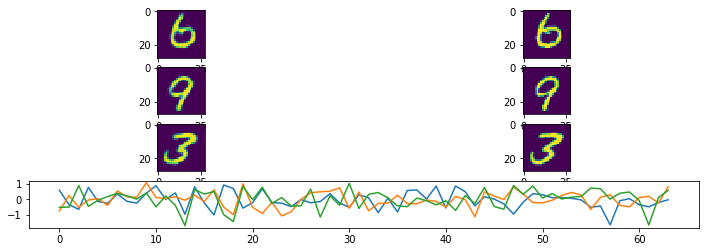

Epoch:  65 Iteration:  0 Loss:  80.27933 64.16826 16.111063


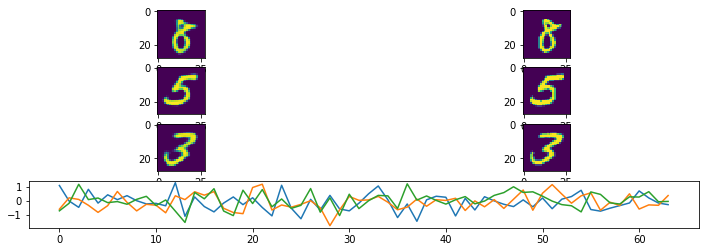

Epoch:  65 Iteration:  200 Loss:  80.03924 64.134224 15.90502


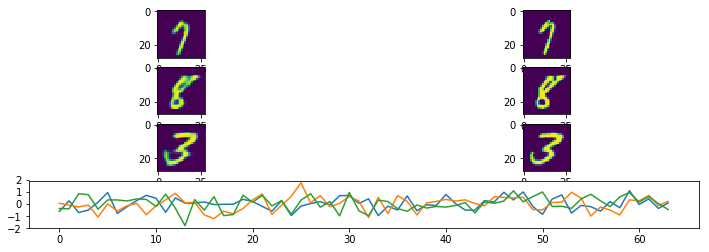

Epoch:  65 Iteration:  400 Loss:  79.11258 63.226604 15.885973


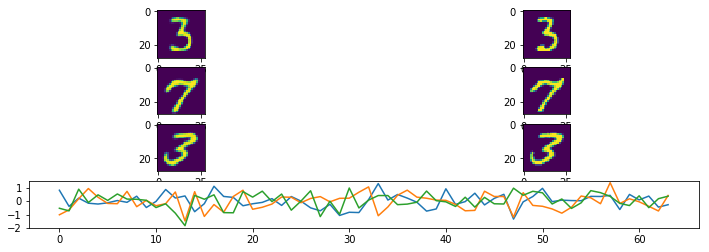

Epoch:  66 Iteration:  0 Loss:  81.10258 64.963455 16.139114


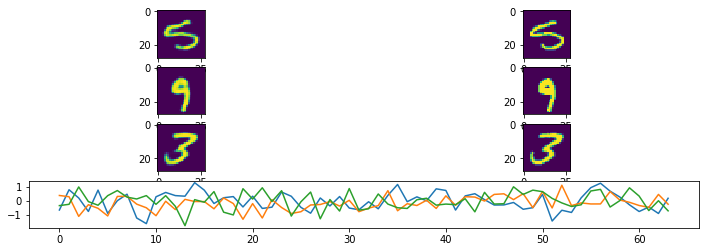

Epoch:  66 Iteration:  200 Loss:  80.356415 64.1981 16.158316


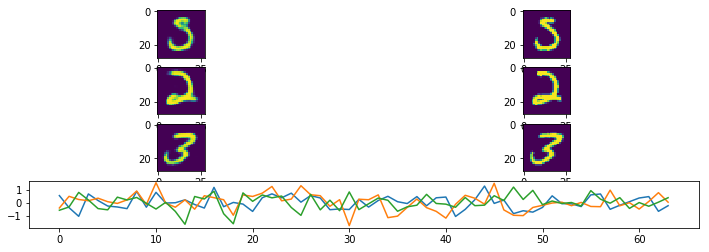

Epoch:  66 Iteration:  400 Loss:  79.62165 63.7169 15.904753


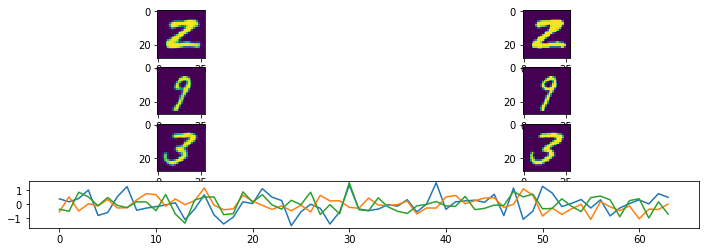

Epoch:  67 Iteration:  0 Loss:  80.392365 64.34323 16.049118


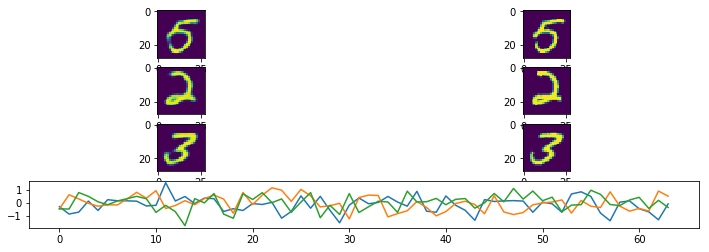

Epoch:  67 Iteration:  200 Loss:  79.93757 63.880615 16.056952


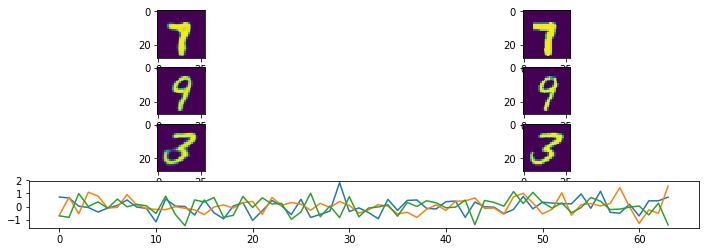

Epoch:  67 Iteration:  400 Loss:  79.795525 63.820606 15.974918


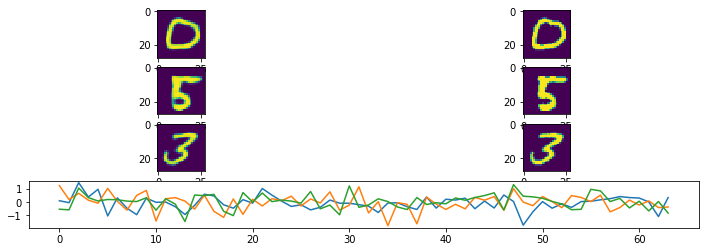

Epoch:  68 Iteration:  0 Loss:  81.00839 64.93439 16.074007


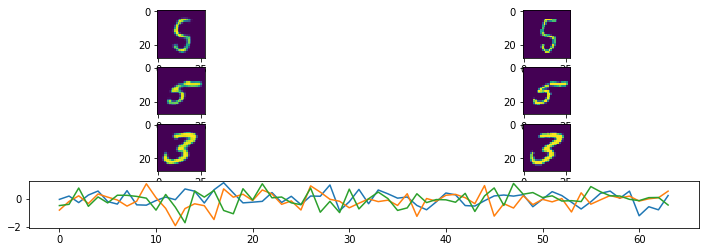

Epoch:  68 Iteration:  200 Loss:  80.06233 64.29326 15.769078


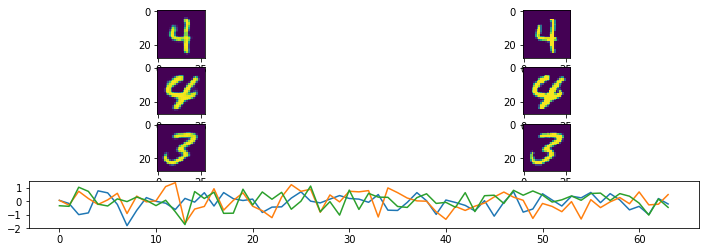

Epoch:  68 Iteration:  400 Loss:  79.49072 63.529594 15.961134


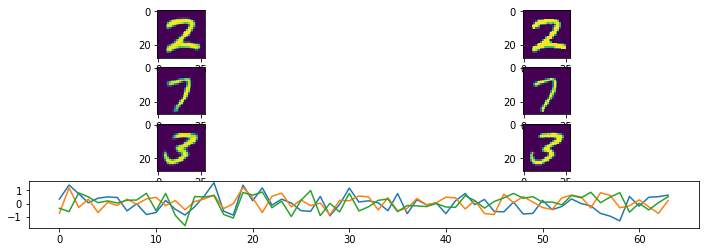

Epoch:  69 Iteration:  0 Loss:  80.58536 64.399895 16.18546


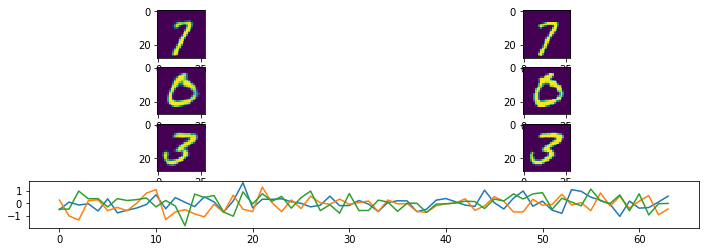

Epoch:  69 Iteration:  200 Loss:  79.40952 63.427113 15.982408


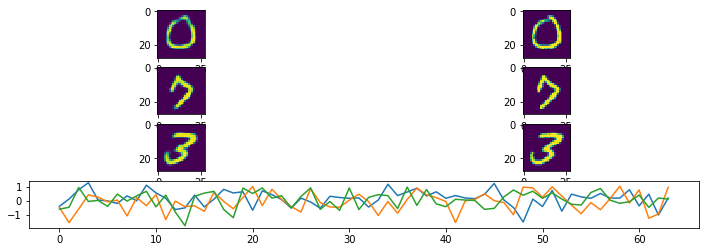

Epoch:  69 Iteration:  400 Loss:  79.165825 63.3079 15.85792


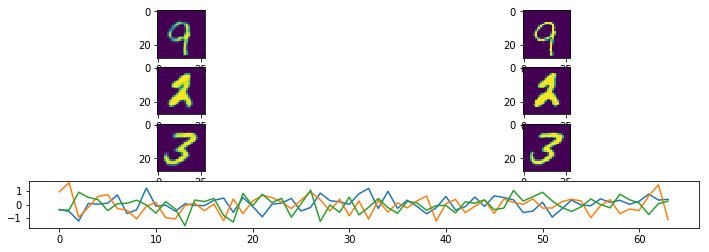

Epoch:  70 Iteration:  0 Loss:  80.49468 64.39022 16.104464


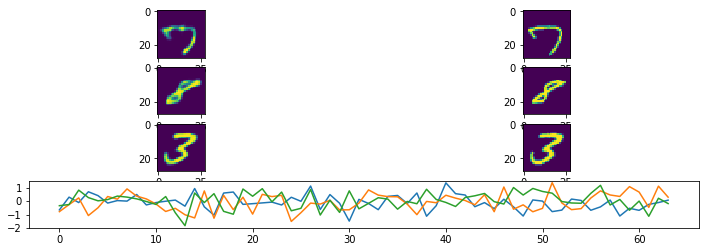

Epoch:  70 Iteration:  200 Loss:  80.07866 64.03732 16.04134


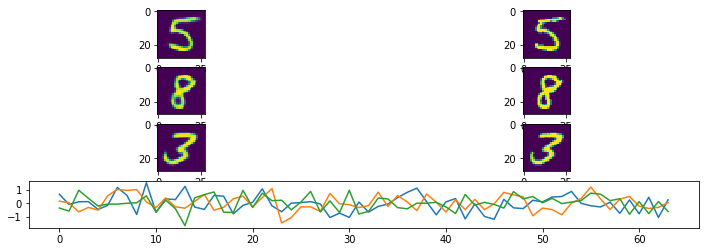

Epoch:  70 Iteration:  400 Loss:  79.190414 63.327682 15.862732


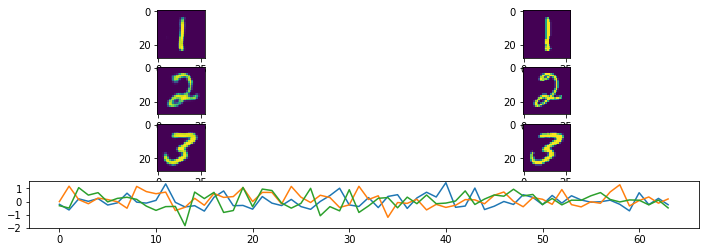

Epoch:  71 Iteration:  0 Loss:  80.36925 64.196014 16.17323


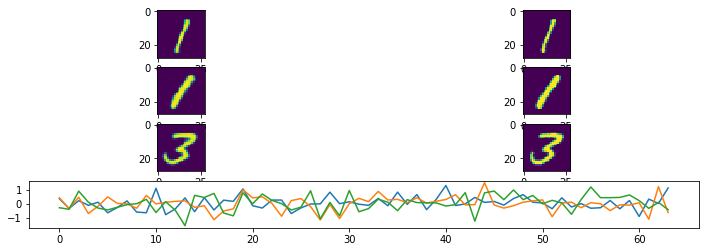

Epoch:  71 Iteration:  200 Loss:  79.52887 63.507458 16.021412


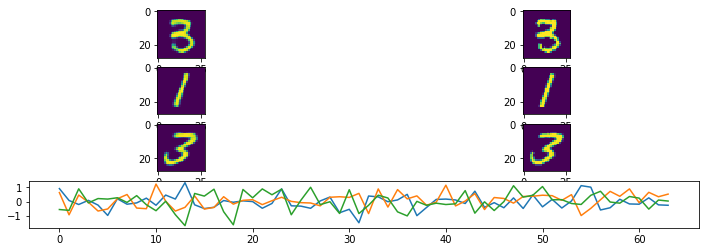

Epoch:  71 Iteration:  400 Loss:  79.3499 63.399666 15.950239


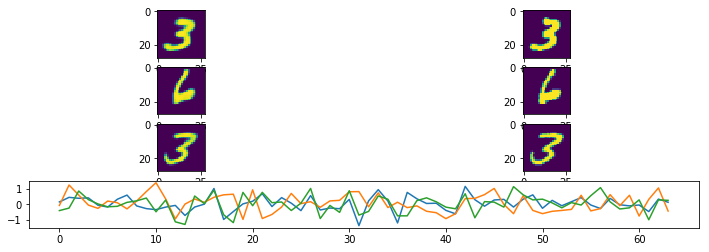

Epoch:  72 Iteration:  0 Loss:  80.01926 63.85577 16.163494


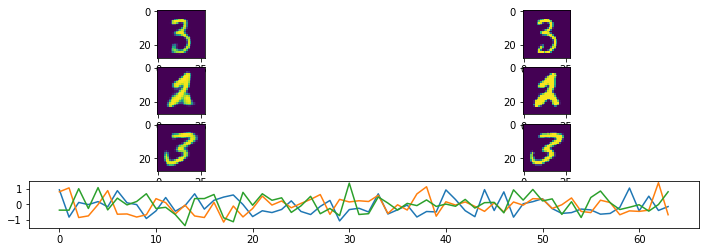

Epoch:  72 Iteration:  200 Loss:  79.142944 63.17185 15.971101


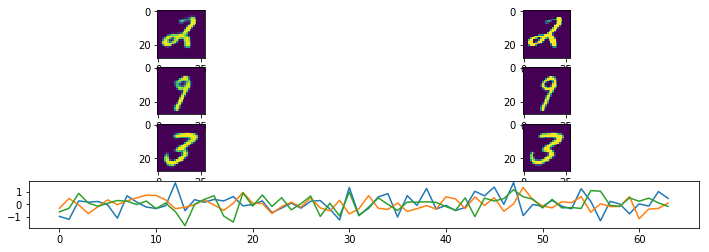

Epoch:  72 Iteration:  400 Loss:  79.4491 63.61841 15.830684


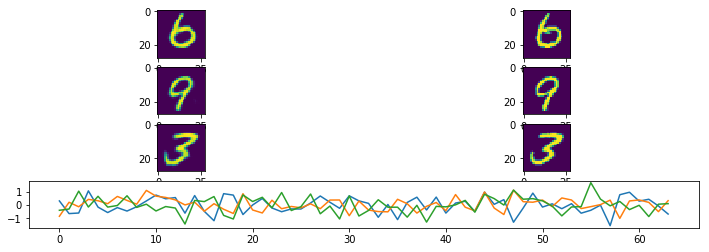

Epoch:  73 Iteration:  0 Loss:  80.6366 64.517975 16.11863


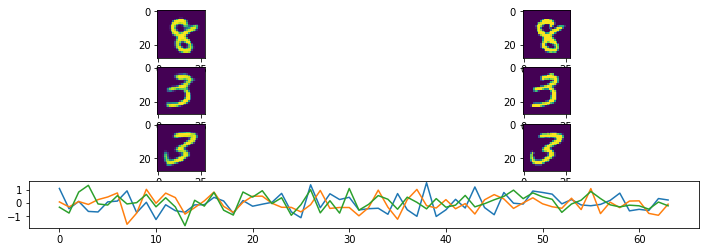

Epoch:  73 Iteration:  200 Loss:  79.43373 63.458656 15.975069


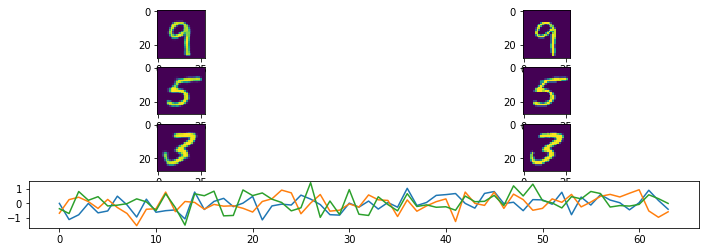

Epoch:  73 Iteration:  400 Loss:  78.50893 62.522316 15.986611


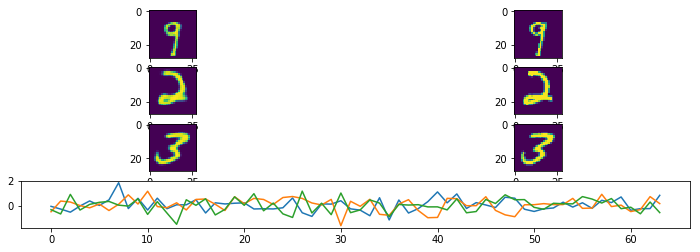

Epoch:  74 Iteration:  0 Loss:  80.45616 64.24656 16.209595


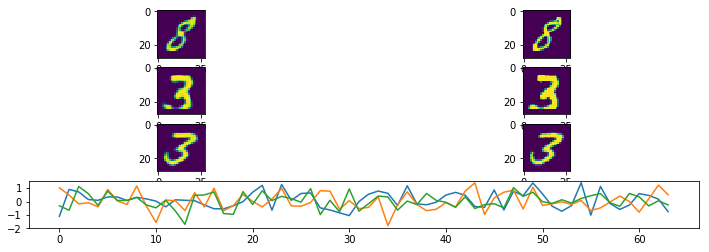

Epoch:  74 Iteration:  200 Loss:  79.6973 63.869576 15.82773


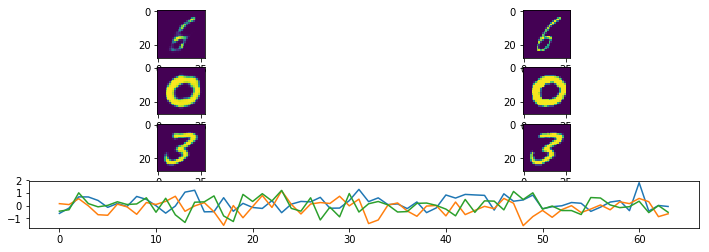

Epoch:  74 Iteration:  400 Loss:  79.36826 63.490868 15.877398


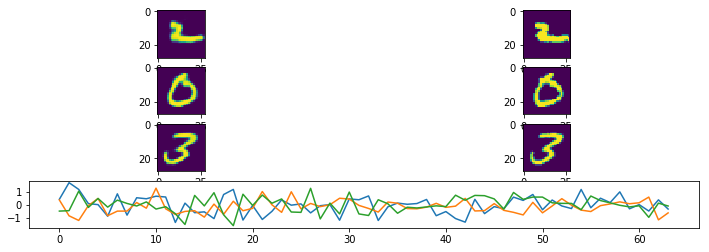

Epoch:  75 Iteration:  0 Loss:  80.67123 64.65814 16.013083


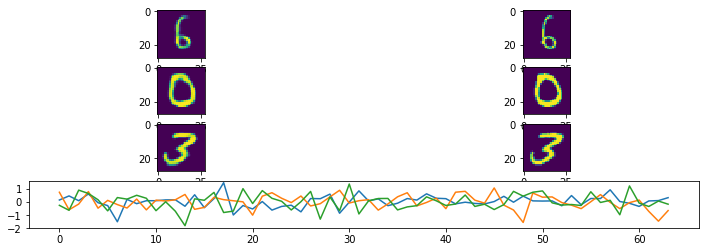

Epoch:  75 Iteration:  200 Loss:  79.54524 63.48239 16.062849


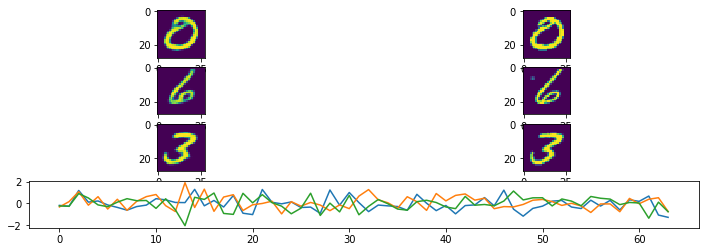

Epoch:  75 Iteration:  400 Loss:  79.10335 63.310326 15.793016


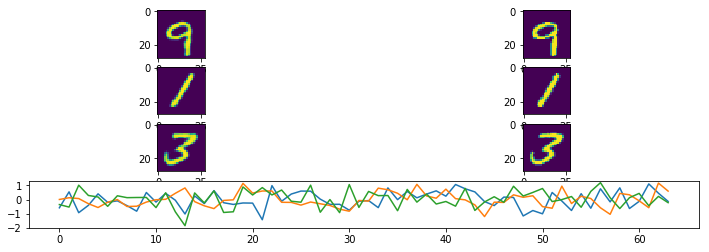

Epoch:  76 Iteration:  0 Loss:  80.26012 64.19195 16.068178


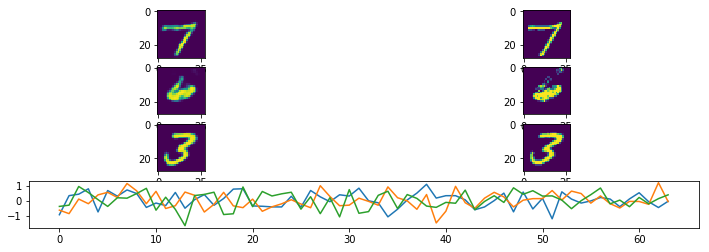

Epoch:  76 Iteration:  200 Loss:  79.75322 63.837654 15.915569


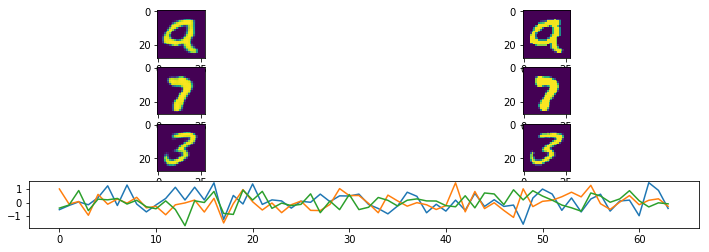

Epoch:  76 Iteration:  400 Loss:  79.194115 63.317715 15.876406


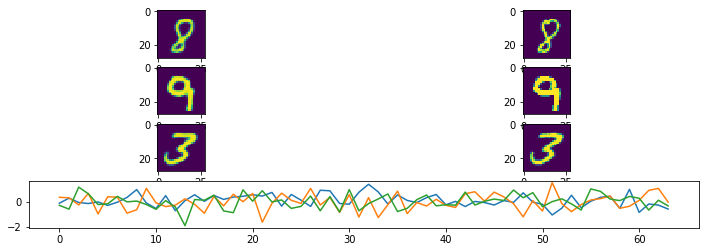

Epoch:  77 Iteration:  0 Loss:  80.28781 64.33194 15.955875


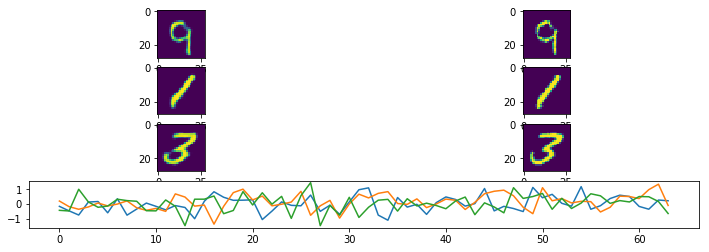

Epoch:  77 Iteration:  200 Loss:  79.46883 63.659744 15.809078


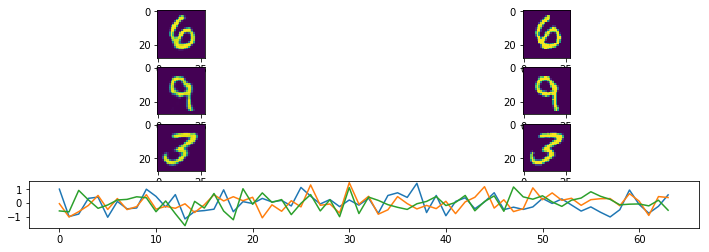

Epoch:  77 Iteration:  400 Loss:  79.22036 63.327126 15.893236


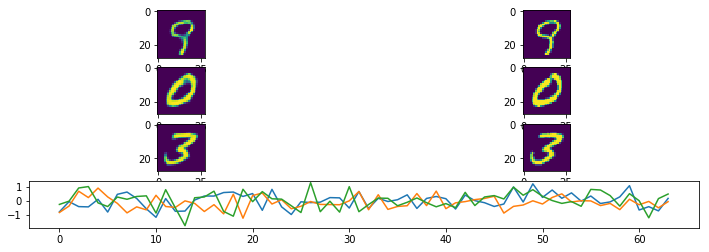

Epoch:  78 Iteration:  0 Loss:  80.596825 64.528885 16.06793


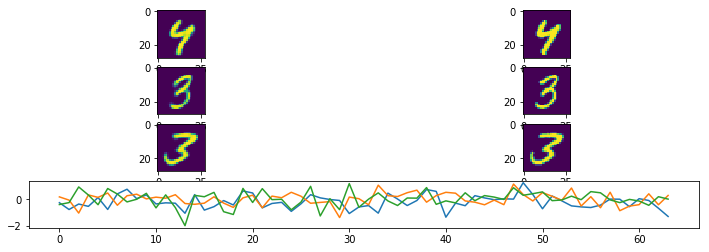

Epoch:  78 Iteration:  200 Loss:  79.46323 63.624104 15.839117


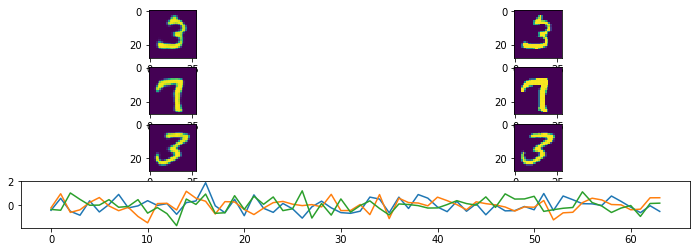

Epoch:  78 Iteration:  400 Loss:  79.0004 63.082344 15.918053


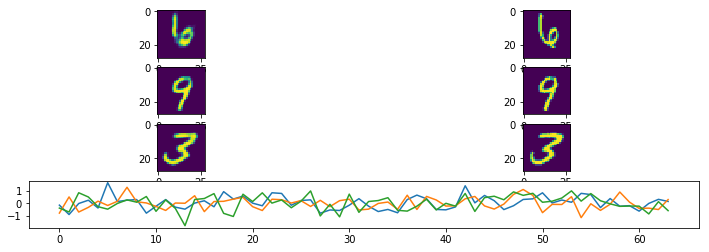

Epoch:  79 Iteration:  0 Loss:  80.586494 64.46142 16.125078


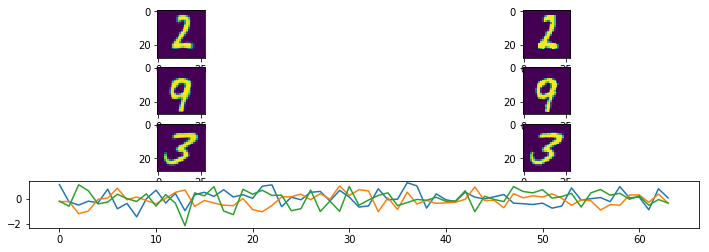

Epoch:  79 Iteration:  200 Loss:  79.72856 63.83394 15.894621


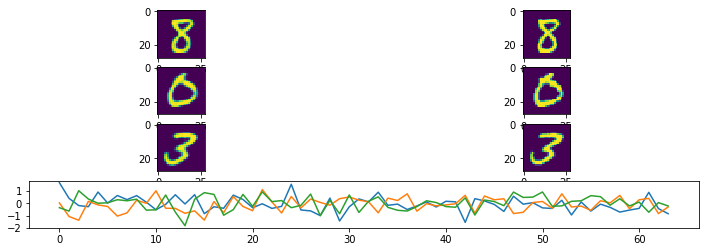

Epoch:  79 Iteration:  400 Loss:  78.79073 62.905067 15.885668


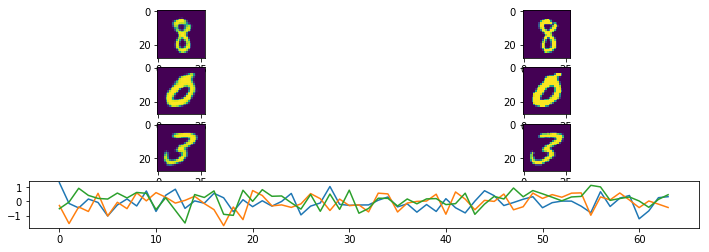

Epoch:  80 Iteration:  0 Loss:  80.349014 64.320786 16.028236


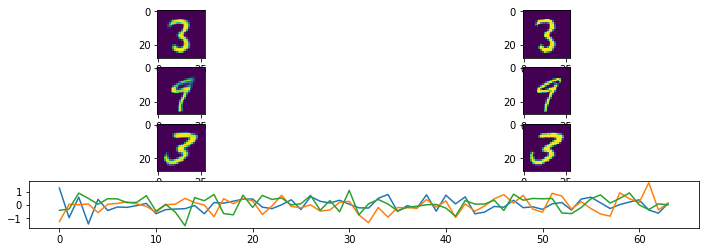

Epoch:  80 Iteration:  200 Loss:  79.384926 63.67575 15.709173


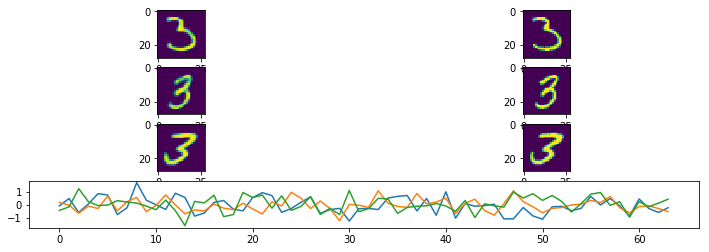

Epoch:  80 Iteration:  400 Loss:  79.04898 63.101387 15.947588


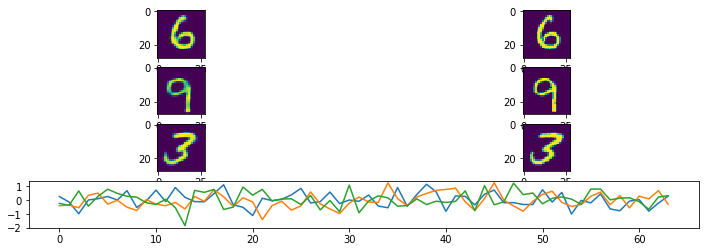

Epoch:  81 Iteration:  0 Loss:  80.33359 64.138916 16.194672


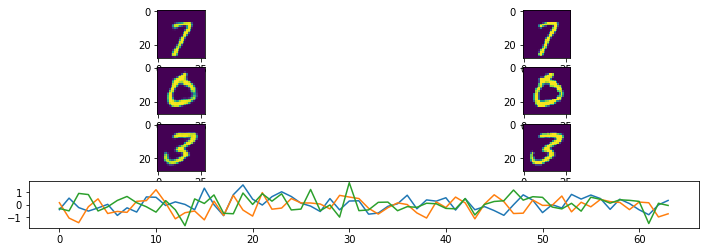

Epoch:  81 Iteration:  200 Loss:  79.18351 63.39421 15.789303


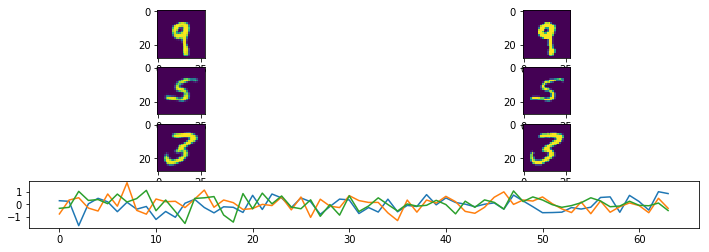

Epoch:  81 Iteration:  400 Loss:  79.021736 63.2236 15.798136


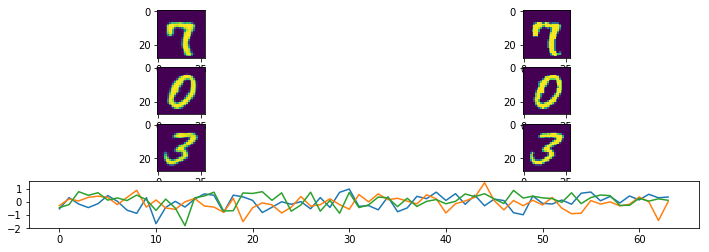

Epoch:  82 Iteration:  0 Loss:  80.11989 64.10959 16.010303


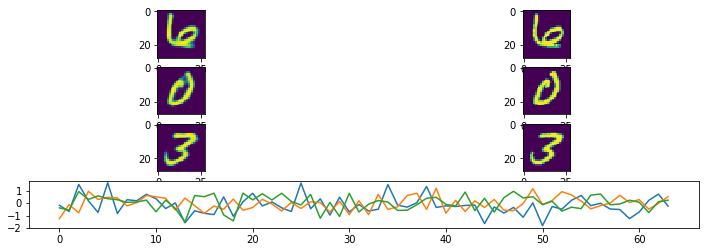

Epoch:  82 Iteration:  200 Loss:  79.71302 63.840378 15.872648


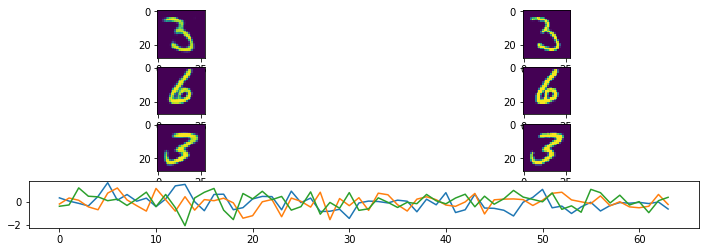

Epoch:  82 Iteration:  400 Loss:  79.40162 63.553436 15.848182


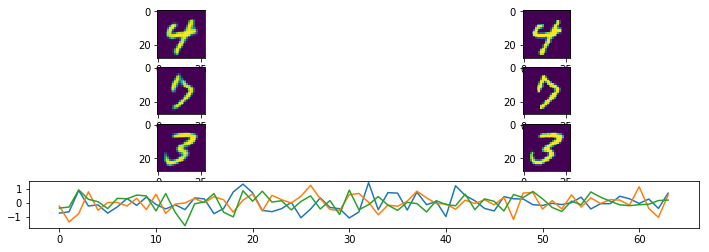

Epoch:  83 Iteration:  0 Loss:  80.137726 64.05875 16.07898


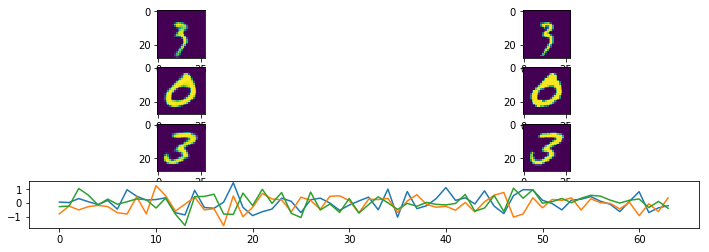

Epoch:  83 Iteration:  200 Loss:  79.22583 63.25683 15.969006


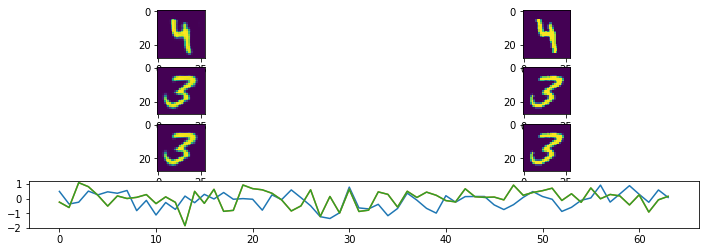

Epoch:  83 Iteration:  400 Loss:  78.57044 62.79144 15.779001


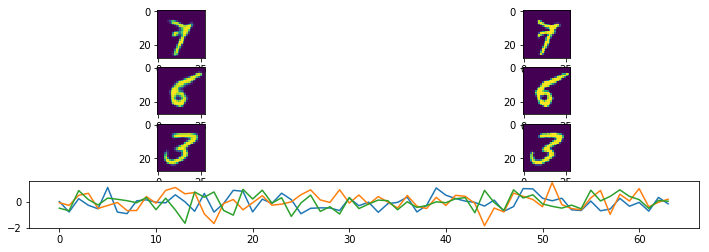

Epoch:  84 Iteration:  0 Loss:  80.3427 64.45383 15.888875


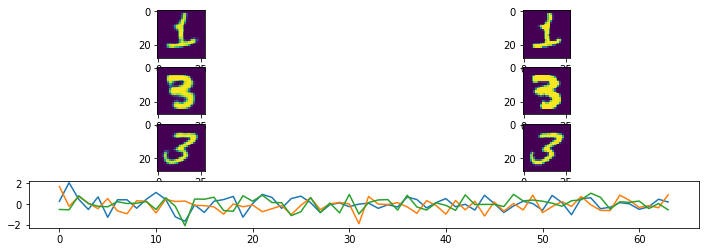

Epoch:  84 Iteration:  200 Loss:  79.16588 63.227287 15.938591


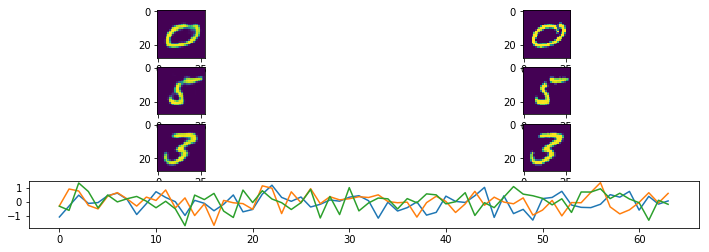

Epoch:  84 Iteration:  400 Loss:  78.831345 63.038174 15.793177


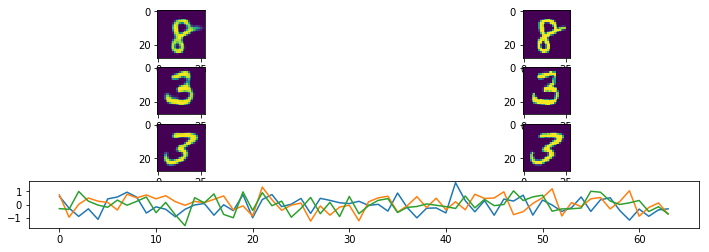

Epoch:  85 Iteration:  0 Loss:  79.848114 63.75933 16.088783


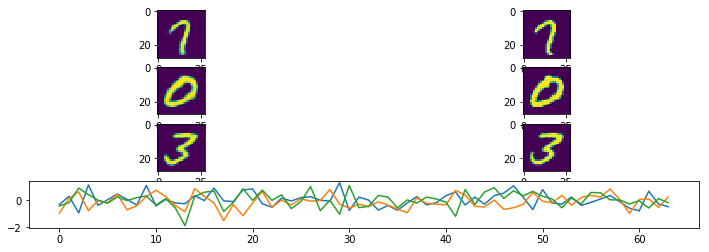

Epoch:  85 Iteration:  200 Loss:  79.48537 63.6055 15.879865


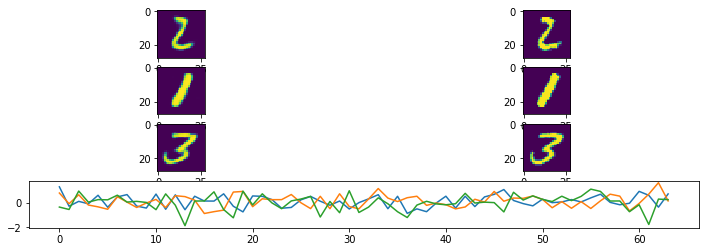

Epoch:  85 Iteration:  400 Loss:  78.78832 63.008713 15.77961


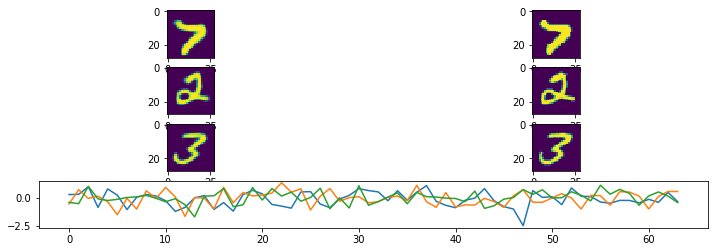

Epoch:  86 Iteration:  0 Loss:  79.67318 63.582256 16.090923


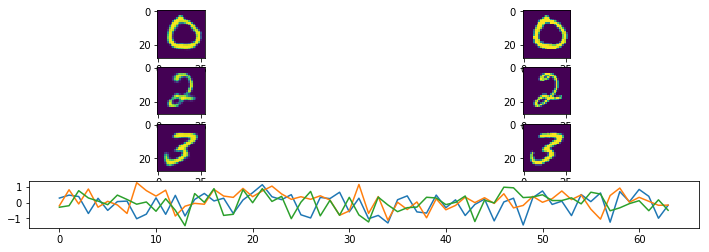

Epoch:  86 Iteration:  200 Loss:  79.23782 63.431 15.8068285


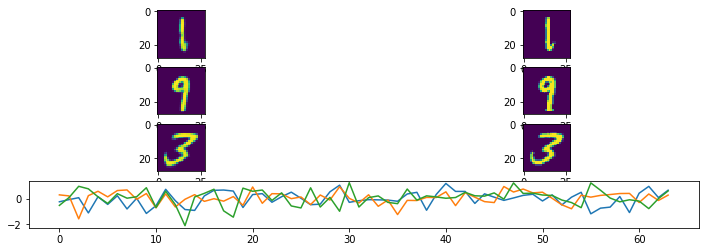

Epoch:  86 Iteration:  400 Loss:  79.300674 63.59619 15.704475


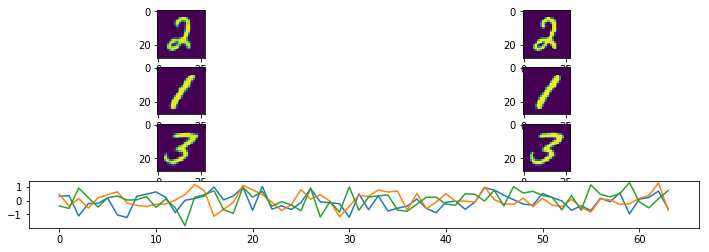

Epoch:  87 Iteration:  0 Loss:  80.16321 63.999397 16.163815


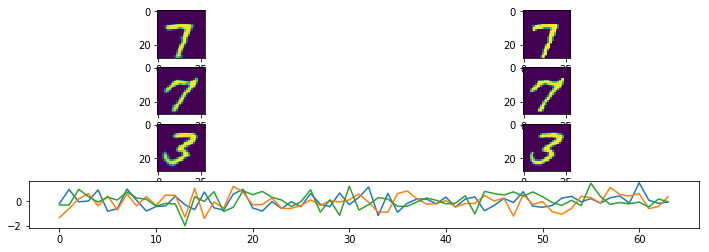

Epoch:  87 Iteration:  200 Loss:  79.08132 63.334007 15.747315


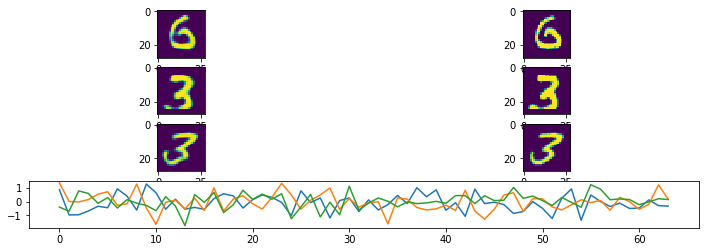

Epoch:  87 Iteration:  400 Loss:  78.03934 62.36624 15.673098


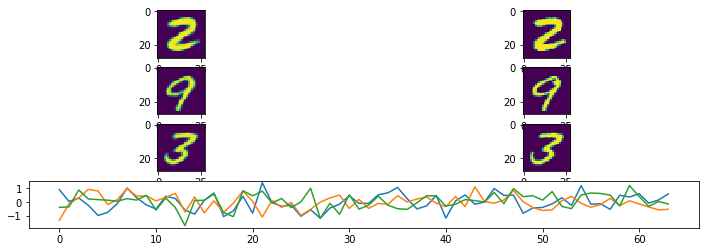

Epoch:  88 Iteration:  0 Loss:  79.99556 63.919907 16.075659


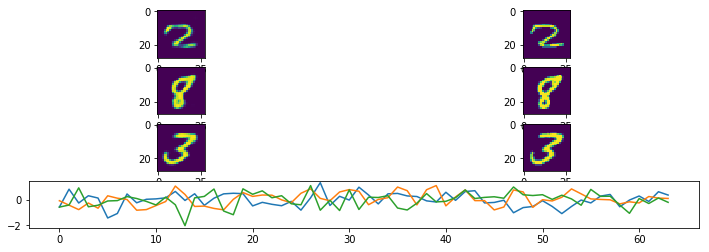

Epoch:  88 Iteration:  200 Loss:  79.229614 63.482697 15.746922


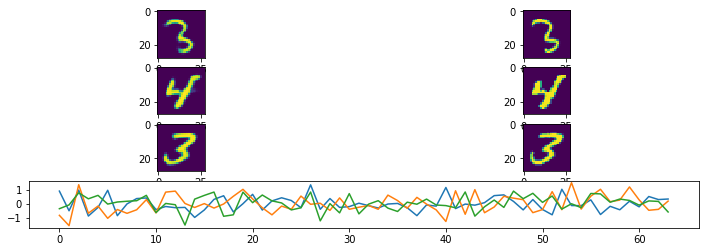

Epoch:  88 Iteration:  400 Loss:  78.88136 63.030342 15.851025


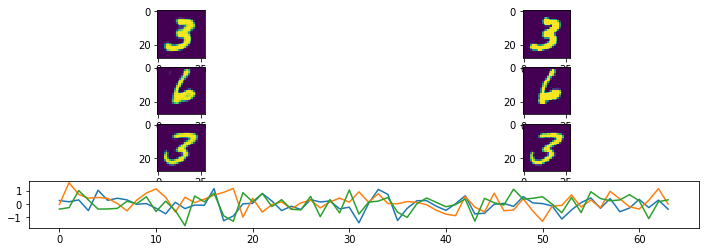

Epoch:  89 Iteration:  0 Loss:  79.938065 63.915924 16.02214


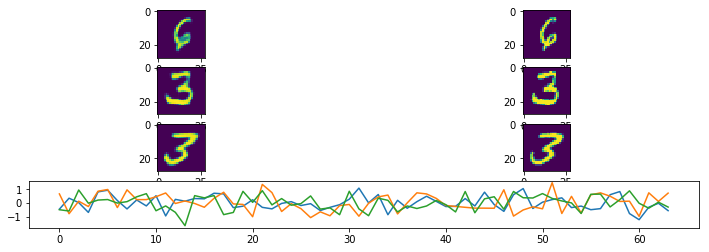

Epoch:  89 Iteration:  200 Loss:  79.06714 63.185524 15.881613


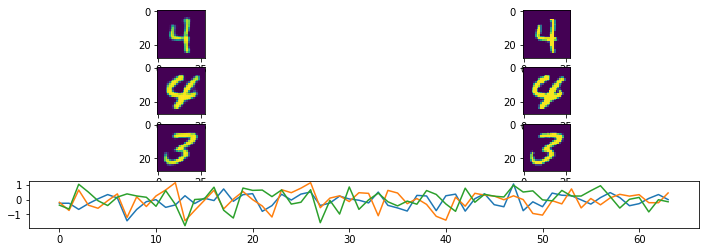

Epoch:  89 Iteration:  400 Loss:  78.24888 62.493412 15.755465


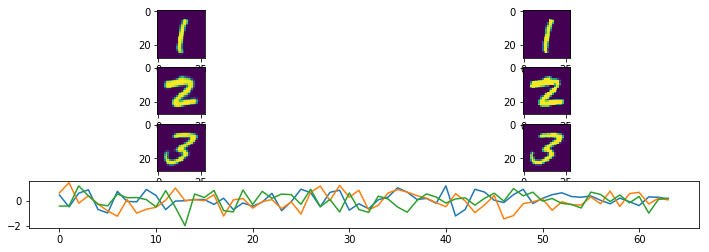

Epoch:  90 Iteration:  0 Loss:  80.10348 64.14874 15.954733


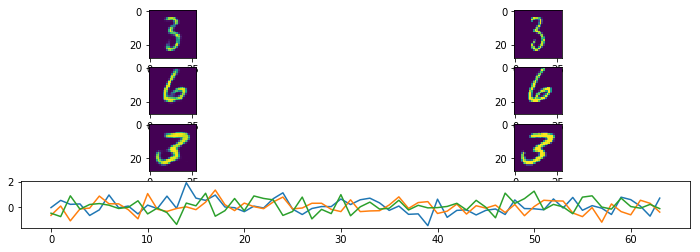

Epoch:  90 Iteration:  200 Loss:  79.28501 63.4758 15.809212


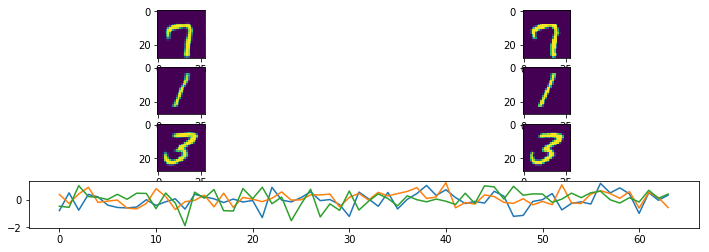

Epoch:  90 Iteration:  400 Loss:  79.14072 63.420357 15.72036


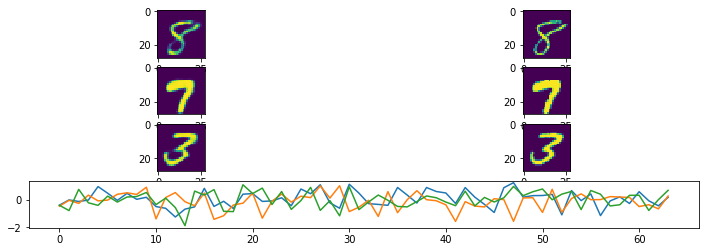

Epoch:  91 Iteration:  0 Loss:  79.51655 63.536507 15.980041


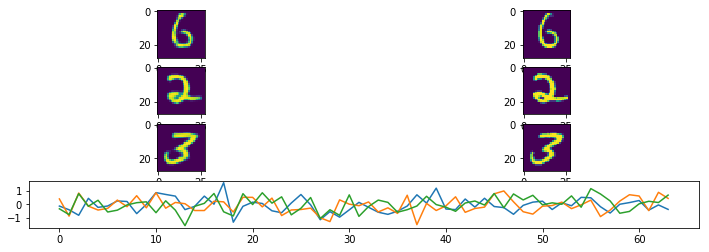

Epoch:  91 Iteration:  200 Loss:  79.35286 63.5783 15.774562


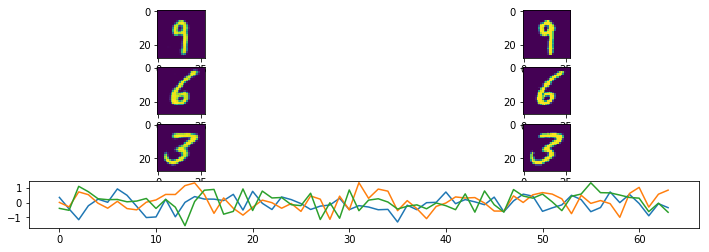

Epoch:  91 Iteration:  400 Loss:  79.139305 63.331306 15.80799


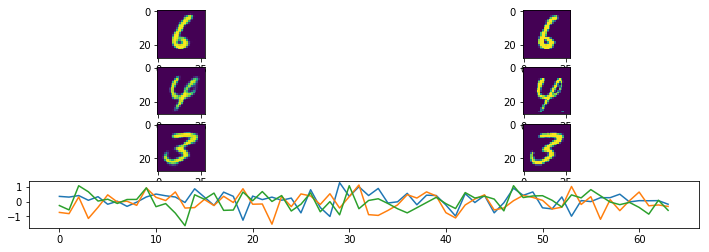

Epoch:  92 Iteration:  0 Loss:  79.45355 63.590153 15.863405


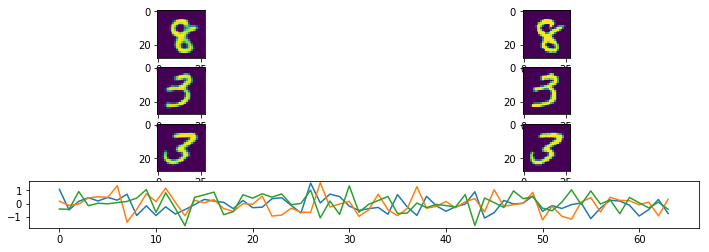

Epoch:  92 Iteration:  200 Loss:  79.34567 63.308113 16.03756


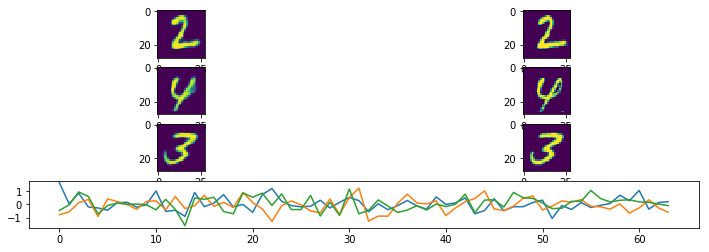

Epoch:  92 Iteration:  400 Loss:  78.55124 62.927265 15.623977


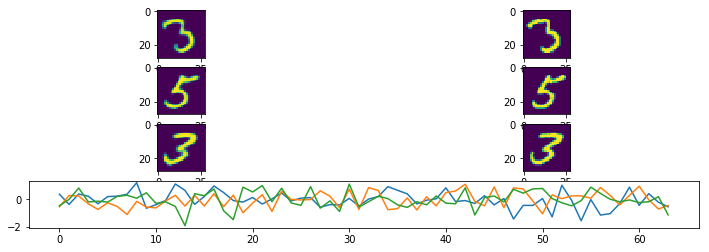

Epoch:  93 Iteration:  0 Loss:  79.81949 63.90443 15.915051


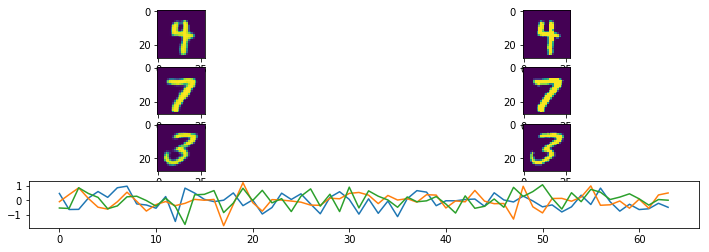

Epoch:  93 Iteration:  200 Loss:  79.53981 63.693768 15.846045


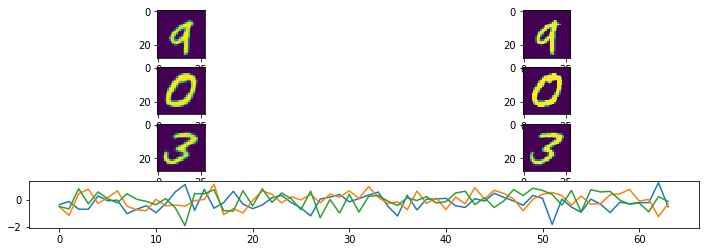

Epoch:  93 Iteration:  400 Loss:  78.73245 63.088543 15.643912


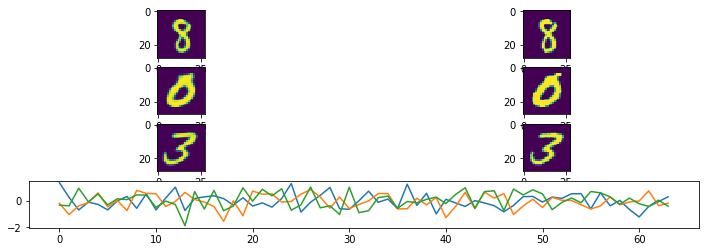

Epoch:  94 Iteration:  0 Loss:  79.61604 63.862312 15.753726


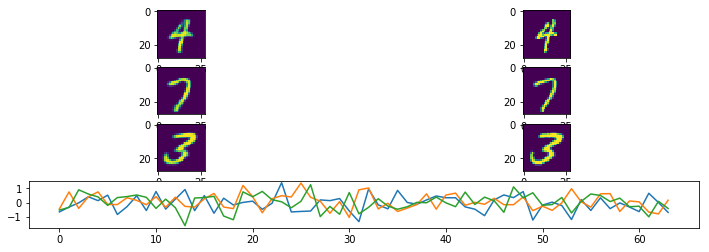

Epoch:  94 Iteration:  200 Loss:  79.11121 63.38957 15.721645


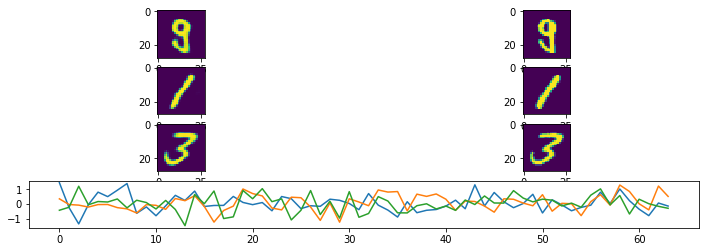

Epoch:  94 Iteration:  400 Loss:  78.91035 63.212433 15.69791


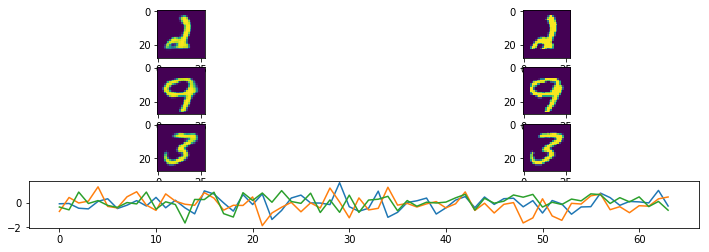

Epoch:  95 Iteration:  0 Loss:  79.5049 63.587486 15.917405


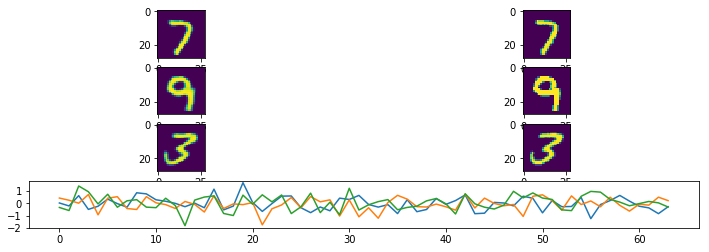

Epoch:  95 Iteration:  200 Loss:  79.157684 63.459114 15.698576


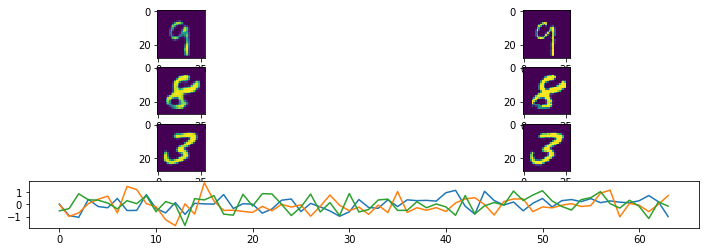

Epoch:  95 Iteration:  400 Loss:  78.9034 63.212585 15.690815


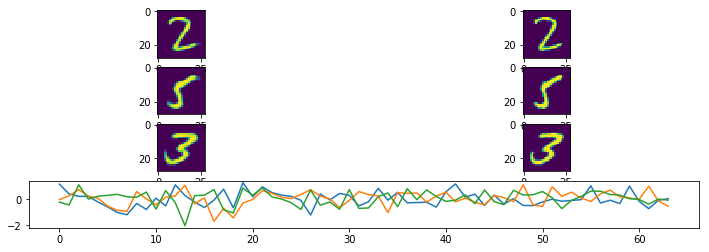

Epoch:  96 Iteration:  0 Loss:  80.02942 64.09841 15.931


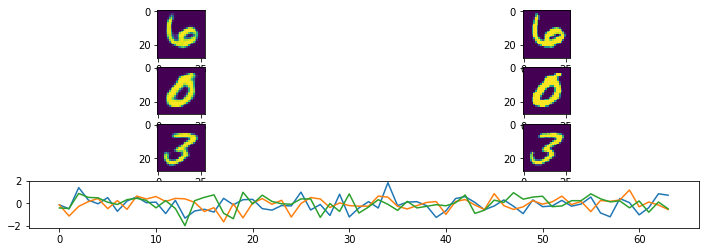

Epoch:  96 Iteration:  200 Loss:  78.79671 63.131935 15.66478


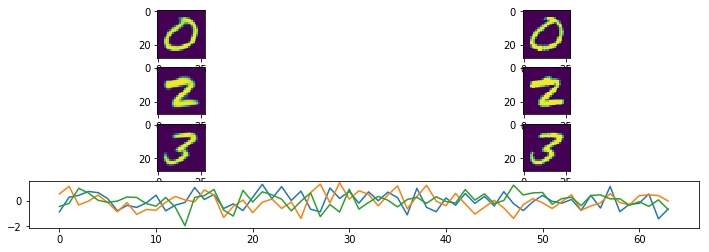

Epoch:  96 Iteration:  400 Loss:  78.811424 63.381958 15.429464


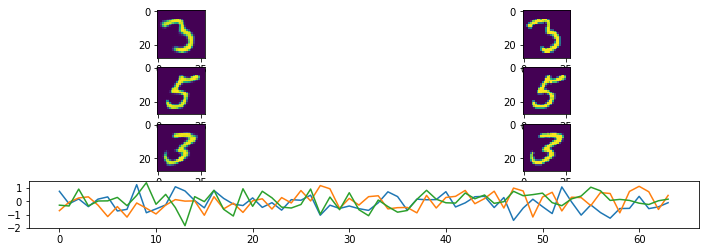

Epoch:  97 Iteration:  0 Loss:  79.85221 63.86976 15.982447


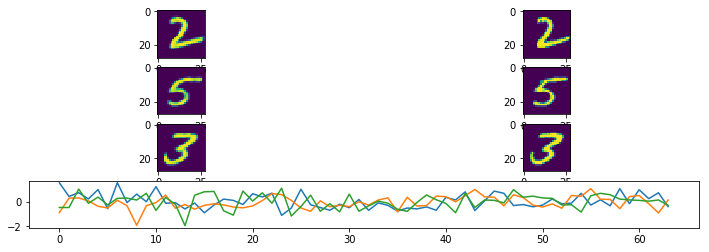

Epoch:  97 Iteration:  200 Loss:  78.62749 62.66593 15.961559


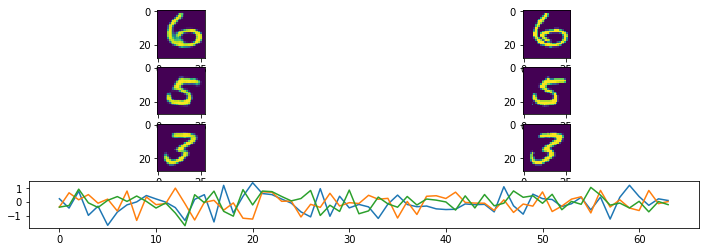

Epoch:  97 Iteration:  400 Loss:  78.52866 62.786934 15.741724


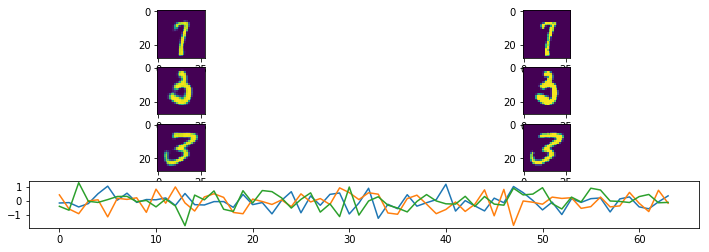

Epoch:  98 Iteration:  0 Loss:  79.58654 63.484695 16.10184


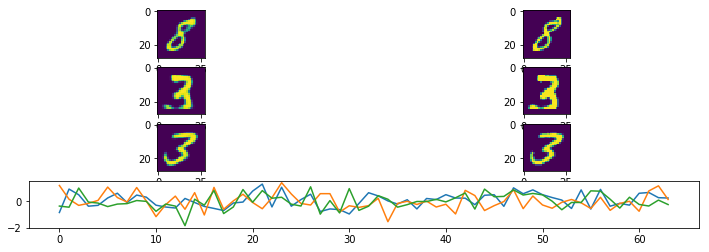

Epoch:  98 Iteration:  200 Loss:  78.59325 62.938797 15.654444


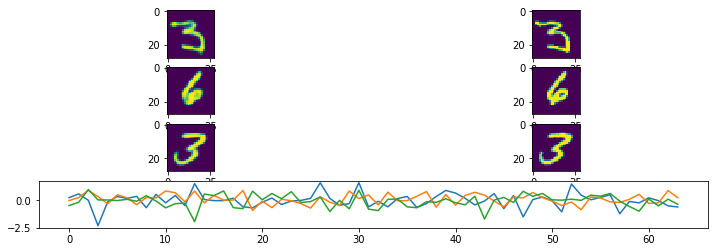

Epoch:  98 Iteration:  400 Loss:  78.988785 63.358063 15.63072


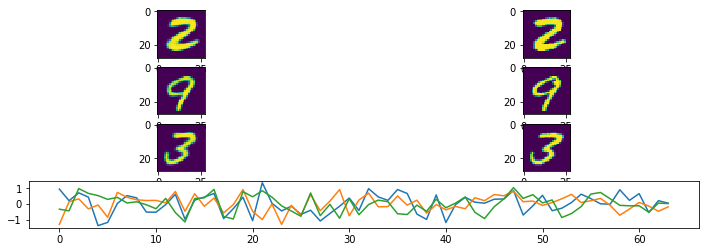

Epoch:  99 Iteration:  0 Loss:  80.11238 64.03424 16.078152


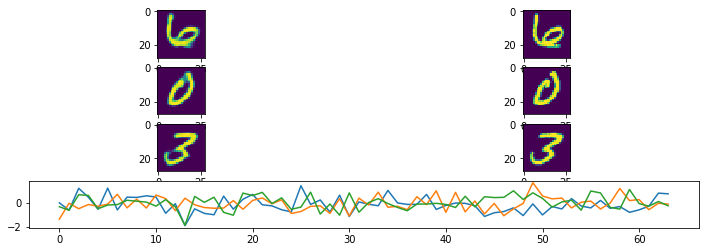

Epoch:  99 Iteration:  200 Loss:  79.26474 63.461037 15.803707


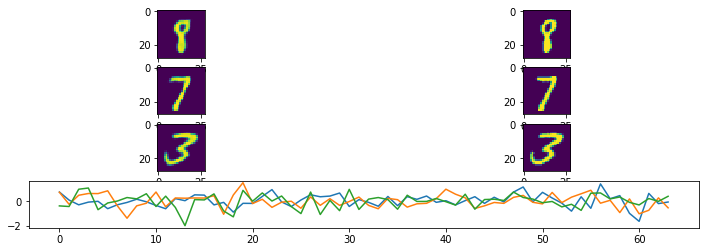

Epoch:  99 Iteration:  400 Loss:  78.514435 62.781525 15.732907


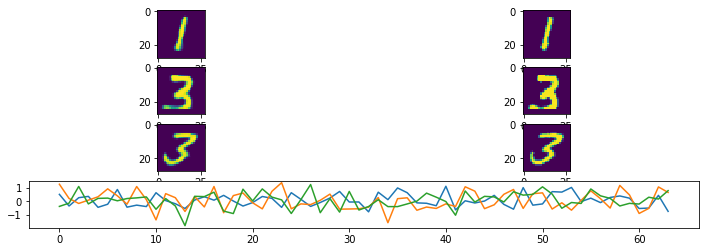

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 28
p_height = 28
p_nchannels = 1
p_channels = [0]
p_nepochs = 100
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 64 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_slam = .0005
p_denoise = None
enc_sizes = [(32, 3), (64, 3)] #, (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['slam'] = p_slam
params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes
params['denoise'] = p_denoise
cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-06-05-MNIST-VAE"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_vae.train(p_mmdict, p_df, params, 200, cpdir)

In [5]:
x = 4
x

4